# 104人力銀行網站爬蟲練習
## 從104人力銀行網站爬取求職公司資訊。

In [1]:
import time
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.keys import Keys

### 首先進入104人力銀行網站：https://www.104.com.tw/cust/list/index/
### 在"地區"及"產業"下拉式選單中，選擇你希望的選項，然後按下"找公司"按鈕。

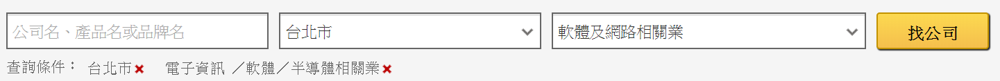

### 開啟新網頁後，觀察新的網址內容，把網址複製下來。

In [2]:
job_104_url = "https://www.104.com.tw/cust/list/index/?page=1&order=1&mode=s&jobsource=checkc&area=6001001000&indcat=1001000000"

### 開始爬取搜尋結果

In [3]:
browser = webdriver.Chrome(executable_path='./Data/chromedriver')
browser.get(job_104_url)  # 打開瀏覽器並連到網頁
time.sleep(2)  # delay一段時間等待網頁更新完成

while True:
    time.sleep(5)  # delay一段時間等待網頁更新完成
    html = browser.page_source
    soup = BeautifulSoup(html, 'lxml')
    page_total = soup.find("div", attrs={'class':"page-total"})['data-total']
    active_page = soup.find("a", attrs={'class':"page-num active"})['data-value']
    
    print('==========目前在第{}頁/共{}頁==========\n'.format(active_page, page_total))

    company_list = soup.find("div", attrs={'id':"company-result"}).find_all("article", attrs={'class':"items"})
    print(company_list)

    print('\n>>>>>>>>>>寫入檔案中...<<<<<<<<<<')

    #
    # 擷取公司名稱及簡介內容
    #
    for company in company_list:
        # 因為內容太多，我們把爬取到的結果，寫入"company_list.txt"檔案中，稍後再來檢視
        company_name = company.a.string
        f = open("Data/company_list.txt", "a+", encoding='utf-8')
        f.write( company_name + "\n" )  # 寫入公司名稱
        
        company_desc = company.find("p", attrs={'class':"desc"})
        f.write( company_desc.string + "\n" )  # 寫入公司簡介
        f.write( "--------------------------------------------------------------------------------" + "\n" )
        f.close()
    
    if active_page == page_total:
        print('\n==========沒有下一頁了==========')
        break
    else:
        print('↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻')
        browser.find_element_by_link_text('下一頁').click()
        continue

# 關閉瀏覽器
browser.quit();

==========目前在第1頁/共151頁==========

[<article class="items">
<div class="info">
<h1>
<a href="https://www.104.com.tw/company/1a2x6biwgp?jobsource=checkc" target="_blank" title="&lt;東祥資訊股份有限公司&gt;">東祥資訊股份有限公司</a>
<span class="color-gray font-s16 always-on-text" data-gtm-vis-first-on-screen-2480980_836="1021" data-gtm-vis-has-fired-2480980_836="1" data-gtm-vis-recent-on-screen-2480980_836="1021" data-gtm-vis-total-visible-time-2480980_836="100">暫無工作機會，可儲存公司訂閱新工作</span>
</h1>
<p class="data">
<span>台北市中山區</span>，<span>電腦系統整合服務業</span>
</p>
<p class="data">
<span>資本額：2000萬元</span>，<span>員工人數：40人</span>
</p>
<p class="desc">本公司專門提供網路通訊系統、資訊安全系統、主機系統等電腦系統整合服務，我們擁有經驗豐富的專業團隊以及多年整合經驗，能針對各種需求，提供專業的諮詢與建議，提供最符合經濟效益的解決方案，成功贏得廣大客戶的支持與信賴。</p>
</div>
<div class="action">
<button class="button act-save" data-custno="1a2x6biwgp" data-gtm="AO儲存公司" title="儲存公司" type="button">
<i class="jbi-s18-star-dark"></i> 儲存公司                </button>
<button class="button act-notice" data-custno="1a2x6biwgp" data-gtm="

==========目前在第2頁/共151頁==========

[<article class="items" data-reactid=".0.1:$112gv33s"><div class="info" data-reactid=".0.1:$112gv33s.0"><div class="jbi-s18-cust" data-reactid=".0.1:$112gv33s.0.0"></div><h1 data-reactid=".0.1:$112gv33s.0.1"><a data-reactid=".0.1:$112gv33s.0.1.0" href="https://www.104.com.tw/company/112gv33s?jobsource=checkc" target="_blank" title="&lt;網件有限公司&gt;">網件有限公司</a></h1><p class="data" data-reactid=".0.1:$112gv33s.0.2"><span data-reactid=".0.1:$112gv33s.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$112gv33s.0.2.1"><span data-reactid=".0.1:$112gv33s.0.2.1.0">，</span><span data-reactid=".0.1:$112gv33s.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$112gv33s.0.3"><span data-reactid=".0.1:$112gv33s.0.3.0"><span data-reactid=".0.1:$112gv33s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$112gv33s.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$112gv33s.0.3.1">，</span><span data-reactid=".0.1:$112gv33s.0.3.2"><span data-reactid=".0.1:$112gv3

==========目前在第3頁/共151頁==========

[<article class="items" data-reactid=".0.1:$cy1uxpk"><div class="info" data-reactid=".0.1:$cy1uxpk.0"><h1 data-reactid=".0.1:$cy1uxpk.0.1"><a data-reactid=".0.1:$cy1uxpk.0.1.0" href="https://www.104.com.tw/company/cy1uxpk?jobsource=checkc" target="_blank" title="&lt;新聚能科技股份有限公司&gt;">新聚能科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$cy1uxpk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$cy1uxpk.0.2"><span data-reactid=".0.1:$cy1uxpk.0.2.0">台北市信義區</span><span data-reactid=".0.1:$cy1uxpk.0.2.1"><span data-reactid=".0.1:$cy1uxpk.0.2.1.0">，</span><span data-reactid=".0.1:$cy1uxpk.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$cy1uxpk.0.3"><span data-reactid=".0.1:$cy1uxpk.0.3.0"><span data-reactid=".0.1:$cy1uxpk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$cy1uxpk.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$cy1uxpk.0.3.1">，</span><span data-reactid=".0.1:$cy1uxpk.

==========目前在第4頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl3oz"><div class="info" data-reactid=".0.1:$1a2x6bl3oz.0"><h1 data-reactid=".0.1:$1a2x6bl3oz.0.1"><a data-reactid=".0.1:$1a2x6bl3oz.0.1.0" href="https://www.104.com.tw/company/1a2x6bl3oz?jobsource=checkc" target="_blank" title="&lt;台幅傳媒股份有限公司&gt;">台幅傳媒股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl3oz.0.2"><span data-reactid=".0.1:$1a2x6bl3oz.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bl3oz.0.2.1"><span data-reactid=".0.1:$1a2x6bl3oz.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl3oz.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl3oz.0.3"><span data-reactid=".0.1:$1a2x6bl3oz.0.3.0"><span data-reactid=".0.1:$1a2x6bl3oz.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl3oz.0.3.0.1">100萬元</span></span><span data-reactid=".0.1:$1a2x6bl3oz.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl3oz.0.3.2"><span data-reactid=".0.1:$1a2x6bl3oz.0.3.2.0">員工人數：</span>

==========目前在第5頁/共151頁==========

[<article class="items" data-reactid=".0.1:$olw6z6g"><div class="info" data-reactid=".0.1:$olw6z6g.0"><h1 data-reactid=".0.1:$olw6z6g.0.1"><a data-reactid=".0.1:$olw6z6g.0.1.0" href="https://www.104.com.tw/company/olw6z6g?jobsource=checkc" target="_blank" title="&lt;台灣八頁企業有限公司&gt;">台灣八頁企業有限公司</a></h1><p class="data" data-reactid=".0.1:$olw6z6g.0.2"><span data-reactid=".0.1:$olw6z6g.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$olw6z6g.0.2.1"><span data-reactid=".0.1:$olw6z6g.0.2.1.0">，</span><span data-reactid=".0.1:$olw6z6g.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$olw6z6g.0.3"><span data-reactid=".0.1:$olw6z6g.0.3.0"><span data-reactid=".0.1:$olw6z6g.0.3.0.0">資本額：</span><span data-reactid=".0.1:$olw6z6g.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$olw6z6g.0.3.1">，</span><span data-reactid=".0.1:$olw6z6g.0.3.2"><span data-reactid=".0.1:$olw6z6g.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$olw6z6g.0.3.2.1">15人</s

==========目前在第6頁/共151頁==========

[<article class="items" data-reactid=".0.1:$29z4jq0"><div class="info" data-reactid=".0.1:$29z4jq0.0"><h1 data-reactid=".0.1:$29z4jq0.0.1"><a data-reactid=".0.1:$29z4jq0.0.1.0" href="https://www.104.com.tw/company/29z4jq0?jobsource=checkc" target="_blank" title="&lt;任氏電子工業股份有限公司&gt;">任氏電子工業股份有限公司</a></h1><p class="data" data-reactid=".0.1:$29z4jq0.0.2"><span data-reactid=".0.1:$29z4jq0.0.2.0">台北市中山區</span><span data-reactid=".0.1:$29z4jq0.0.2.1"><span data-reactid=".0.1:$29z4jq0.0.2.1.0">，</span><span data-reactid=".0.1:$29z4jq0.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$29z4jq0.0.3"><span data-reactid=".0.1:$29z4jq0.0.3.0"><span data-reactid=".0.1:$29z4jq0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$29z4jq0.0.3.0.1">2000萬元</span></span><span data-reactid=".0.1:$29z4jq0.0.3.1">，</span><span data-reactid=".0.1:$29z4jq0.0.3.2"><span data-reactid=".0.1:$29z4jq0.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$29z4jq0.0.3.2.1"

==========目前在第7頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkwoo"><div class="info" data-reactid=".0.1:$1a2x6bkwoo.0"><h1 data-reactid=".0.1:$1a2x6bkwoo.0.1"><a data-reactid=".0.1:$1a2x6bkwoo.0.1.0" href="https://www.104.com.tw/company/1a2x6bkwoo?jobsource=checkc" target="_blank" title="&lt;匯才科技有限公司&gt;">匯才科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkwoo.0.2"><span data-reactid=".0.1:$1a2x6bkwoo.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bkwoo.0.2.1"><span data-reactid=".0.1:$1a2x6bkwoo.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkwoo.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkwoo.0.3"><span data-reactid=".0.1:$1a2x6bkwoo.0.3.0"><span data-reactid=".0.1:$1a2x6bkwoo.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkwoo.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkwoo.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkwoo.0.3.2"><span data-reactid=".0.1:$1a2x6bkwoo.0.3.2.0">員工人數：</span><spa

==========目前在第8頁/共151頁==========

[<article class="items" data-reactid=".0.1:$53duvps"><div class="info" data-reactid=".0.1:$53duvps.0"><h1 data-reactid=".0.1:$53duvps.0.1"><a data-reactid=".0.1:$53duvps.0.1.0" href="https://www.104.com.tw/company/53duvps?jobsource=checkc" target="_blank" title="&lt;元佑實業股份有限公司&gt;">元佑實業股份有限公司</a></h1><p class="data" data-reactid=".0.1:$53duvps.0.2"><span data-reactid=".0.1:$53duvps.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$53duvps.0.2.1"><span data-reactid=".0.1:$53duvps.0.2.1.0">，</span><span data-reactid=".0.1:$53duvps.0.2.1.1">通訊機械器材相關業</span></span></p><p class="data" data-reactid=".0.1:$53duvps.0.3"><span data-reactid=".0.1:$53duvps.0.3.0"><span data-reactid=".0.1:$53duvps.0.3.0.0">資本額：</span><span data-reactid=".0.1:$53duvps.0.3.0.1">3000萬元</span></span><span data-reactid=".0.1:$53duvps.0.3.1">，</span><span data-reactid=".0.1:$53duvps.0.3.2"><span data-reactid=".0.1:$53duvps.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$53duvps.0.3.2.1">100人

==========目前在第9頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl3mn"><div class="info" data-reactid=".0.1:$1a2x6bl3mn.0"><h1 data-reactid=".0.1:$1a2x6bl3mn.0.1"><a data-reactid=".0.1:$1a2x6bl3mn.0.1.0" href="https://www.104.com.tw/company/1a2x6bl3mn?jobsource=checkc" target="_blank" title="&lt;台灣艾邁斯半導體股份有限公司&gt;">台灣艾邁斯半導體股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl3mn.0.2"><span data-reactid=".0.1:$1a2x6bl3mn.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bl3mn.0.2.1"><span data-reactid=".0.1:$1a2x6bl3mn.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl3mn.0.2.1.1">半導體製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl3mn.0.3"><span data-reactid=".0.1:$1a2x6bl3mn.0.3.0"><span data-reactid=".0.1:$1a2x6bl3mn.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl3mn.0.3.0.1">12億300萬元</span></span><span data-reactid=".0.1:$1a2x6bl3mn.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl3mn.0.3.2"><span data-reactid=".0.1:$1a2x6bl3mn.0.3.2.0">員

==========目前在第10頁/共151頁==========

[<article class="items" data-reactid=".0.1:$da5httc"><div class="info" data-reactid=".0.1:$da5httc.0"><h1 data-reactid=".0.1:$da5httc.0.1"><a data-reactid=".0.1:$da5httc.0.1.0" href="https://www.104.com.tw/company/da5httc?jobsource=checkc" target="_blank" title="&lt;Datiphy Inc._玄力科技股份有限公司&gt;">Datiphy Inc._玄力科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$da5httc.0.2"><span data-reactid=".0.1:$da5httc.0.2.0">台北市中山區</span><span data-reactid=".0.1:$da5httc.0.2.1"><span data-reactid=".0.1:$da5httc.0.2.1.0">，</span><span data-reactid=".0.1:$da5httc.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$da5httc.0.3"><span data-reactid=".0.1:$da5httc.0.3.0"><span data-reactid=".0.1:$da5httc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$da5httc.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$da5httc.0.3.1">，</span><span data-reactid=".0.1:$da5httc.0.3.2"><span data-reactid=".0.1:$da5httc.0.3.2.0">員工人數：</span><span data-reactid=

==========目前在第11頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkl2l"><div class="info" data-reactid=".0.1:$1a2x6bkl2l.0"><h1 data-reactid=".0.1:$1a2x6bkl2l.0.1"><a data-reactid=".0.1:$1a2x6bkl2l.0.1.0" href="https://www.104.com.tw/company/1a2x6bkl2l?jobsource=checkc" target="_blank" title="&lt;五陽暖暖股份有限公司&gt;">五陽暖暖股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkl2l.0.2"><span data-reactid=".0.1:$1a2x6bkl2l.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bkl2l.0.2.1"><span data-reactid=".0.1:$1a2x6bkl2l.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkl2l.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkl2l.0.3"><span data-reactid=".0.1:$1a2x6bkl2l.0.3.0"><span data-reactid=".0.1:$1a2x6bkl2l.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkl2l.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkl2l.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkl2l.0.3.2"><span data-reactid=".0.1:$1a2x6bkl2l.0.3.2.0">員工人數：</s

==========目前在第12頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjz0x"><div class="info" data-reactid=".0.1:$1a2x6bjz0x.0"><h1 data-reactid=".0.1:$1a2x6bjz0x.0.1"><a data-reactid=".0.1:$1a2x6bjz0x.0.1.0" href="https://www.104.com.tw/company/1a2x6bjz0x?jobsource=checkc" target="_blank" title="&lt;儒進管理顧問有限公司&gt;">儒進管理顧問有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bjz0x.0.2"><span data-reactid=".0.1:$1a2x6bjz0x.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bjz0x.0.2.1"><span data-reactid=".0.1:$1a2x6bjz0x.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjz0x.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjz0x.0.3"><span data-reactid=".0.1:$1a2x6bjz0x.0.3.0"><span data-reactid=".0.1:$1a2x6bjz0x.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjz0x.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bjz0x.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bjz0x.0.3.2"><span data-reactid=".0.1:$1a2x6bjz0x.0.3.2.0">員工人數：</

==========目前在第13頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkjf2"><div class="info" data-reactid=".0.1:$1a2x6bkjf2.0"><h1 data-reactid=".0.1:$1a2x6bkjf2.0.1"><a data-reactid=".0.1:$1a2x6bkjf2.0.1.0" href="https://www.104.com.tw/company/1a2x6bkjf2?jobsource=checkc" target="_blank" title="&lt;英屬維京群島商捷興數位有限公司台灣分公司&gt;">英屬維京群島商捷興數位有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkjf2.0.2"><span data-reactid=".0.1:$1a2x6bkjf2.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkjf2.0.2.1"><span data-reactid=".0.1:$1a2x6bkjf2.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkjf2.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkjf2.0.3"><span data-reactid=".0.1:$1a2x6bkjf2.0.3.0"><span data-reactid=".0.1:$1a2x6bkjf2.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkjf2.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkjf2.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkjf2.0.3.2"><span data-reactid=".0.1:$1a2x6bkjf

==========目前在第14頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bj1n5"><div class="info" data-reactid=".0.1:$1a2x6bj1n5.0"><h1 data-reactid=".0.1:$1a2x6bj1n5.0.1"><a data-reactid=".0.1:$1a2x6bj1n5.0.1.0" href="https://www.104.com.tw/company/1a2x6bj1n5?jobsource=checkc" target="_blank" title="&lt;十三行互動有限公司&gt;">十三行互動有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bj1n5.0.2"><span data-reactid=".0.1:$1a2x6bj1n5.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bj1n5.0.2.1"><span data-reactid=".0.1:$1a2x6bj1n5.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bj1n5.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bj1n5.0.3"><span data-reactid=".0.1:$1a2x6bj1n5.0.3.0"><span data-reactid=".0.1:$1a2x6bj1n5.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bj1n5.0.3.0.1">1250萬元</span></span><span data-reactid=".0.1:$1a2x6bj1n5.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bj1n5.0.3.2"><span data-reactid=".0.1:$1a2x6bj1n5.0.3.2.0">員工人數：</span>

==========目前在第15頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkam3"><div class="info" data-reactid=".0.1:$1a2x6bkam3.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bkam3.0.0"></div><h1 data-reactid=".0.1:$1a2x6bkam3.0.1"><a data-reactid=".0.1:$1a2x6bkam3.0.1.0" href="https://www.104.com.tw/company/1a2x6bkam3?jobsource=checkc" target="_blank" title="&lt;智娛互動科技有限公司&gt;">智娛互動科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkam3.0.2"><span data-reactid=".0.1:$1a2x6bkam3.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkam3.0.2.1"><span data-reactid=".0.1:$1a2x6bkam3.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkam3.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkam3.0.3"><span data-reactid=".0.1:$1a2x6bkam3.0.3.0"><span data-reactid=".0.1:$1a2x6bkam3.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkam3.0.3.0.1">50萬元</span></span><span data-reactid=".0.1:$1a2x6bkam3.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bk

==========目前在第16頁/共151頁==========

[<article class="items" data-reactid=".0.1:$12prlco8"><div class="info" data-reactid=".0.1:$12prlco8.0"><h1 data-reactid=".0.1:$12prlco8.0.1"><a data-reactid=".0.1:$12prlco8.0.1.0" href="https://www.104.com.tw/company/12prlco8?jobsource=checkc" target="_blank" title="&lt;韓代國際股份有限公司&gt;">韓代國際股份有限公司</a></h1><p class="data" data-reactid=".0.1:$12prlco8.0.2"><span data-reactid=".0.1:$12prlco8.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$12prlco8.0.2.1"><span data-reactid=".0.1:$12prlco8.0.2.1.0">，</span><span data-reactid=".0.1:$12prlco8.0.2.1.1">其他半導體相關業</span></span></p><p class="data" data-reactid=".0.1:$12prlco8.0.3"><span data-reactid=".0.1:$12prlco8.0.3.0"><span data-reactid=".0.1:$12prlco8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$12prlco8.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$12prlco8.0.3.1">，</span><span data-reactid=".0.1:$12prlco8.0.3.2"><span data-reactid=".0.1:$12prlco8.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$12pr

==========目前在第17頁/共151頁==========

[<article class="items" data-reactid=".0.1:$bjjdza8"><div class="info" data-reactid=".0.1:$bjjdza8.0"><h1 data-reactid=".0.1:$bjjdza8.0.1"><a data-reactid=".0.1:$bjjdza8.0.1.0" href="https://www.104.com.tw/company/bjjdza8?jobsource=checkc" target="_blank" title="&lt;明象科技股份有限公司&gt;">明象科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$bjjdza8.0.2"><span data-reactid=".0.1:$bjjdza8.0.2.0">台北市信義區</span><span data-reactid=".0.1:$bjjdza8.0.2.1"><span data-reactid=".0.1:$bjjdza8.0.2.1.0">，</span><span data-reactid=".0.1:$bjjdza8.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$bjjdza8.0.3"><span data-reactid=".0.1:$bjjdza8.0.3.0"><span data-reactid=".0.1:$bjjdza8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$bjjdza8.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$bjjdza8.0.3.1">，</span><span data-reactid=".0.1:$bjjdza8.0.3.2"><span data-reactid=".0.1:$bjjdza8.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$bjjdza8.0.3.2.1">暫不提供

==========目前在第18頁/共151頁==========

[<article class="items" data-reactid=".0.1:$10zlkz94"><div class="info" data-reactid=".0.1:$10zlkz94.0"><h1 data-reactid=".0.1:$10zlkz94.0.1"><a data-reactid=".0.1:$10zlkz94.0.1.0" href="https://www.104.com.tw/company/10zlkz94?jobsource=checkc" target="_blank" title="&lt;采悅科技股份有限公司&gt;">采悅科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$10zlkz94.0.2"><span data-reactid=".0.1:$10zlkz94.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$10zlkz94.0.2.1"><span data-reactid=".0.1:$10zlkz94.0.2.1.0">，</span><span data-reactid=".0.1:$10zlkz94.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$10zlkz94.0.3"><span data-reactid=".0.1:$10zlkz94.0.3.0"><span data-reactid=".0.1:$10zlkz94.0.3.0.0">資本額：</span><span data-reactid=".0.1:$10zlkz94.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$10zlkz94.0.3.1">，</span><span data-reactid=".0.1:$10zlkz94.0.3.2"><span data-reactid=".0.1:$10zlkz94.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$10z

==========目前在第19頁/共151頁==========

[<article class="items" data-reactid=".0.1:$dck1bzs"><div class="info" data-reactid=".0.1:$dck1bzs.0"><h1 data-reactid=".0.1:$dck1bzs.0.1"><a data-reactid=".0.1:$dck1bzs.0.1.0" href="https://www.104.com.tw/company/dck1bzs?jobsource=checkc" target="_blank" title="&lt;和盟電子商務股份有限公司&gt;">和盟電子商務股份有限公司</a></h1><p class="data" data-reactid=".0.1:$dck1bzs.0.2"><span data-reactid=".0.1:$dck1bzs.0.2.0">台北市中山區</span><span data-reactid=".0.1:$dck1bzs.0.2.1"><span data-reactid=".0.1:$dck1bzs.0.2.1.0">，</span><span data-reactid=".0.1:$dck1bzs.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$dck1bzs.0.3"><span data-reactid=".0.1:$dck1bzs.0.3.0"><span data-reactid=".0.1:$dck1bzs.0.3.0.0">資本額：</span><span data-reactid=".0.1:$dck1bzs.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$dck1bzs.0.3.1">，</span><span data-reactid=".0.1:$dck1bzs.0.3.2"><span data-reactid=".0.1:$dck1bzs.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$dck1bzs.0.3.2.1">暫不提

==========目前在第20頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkpuh"><div class="info" data-reactid=".0.1:$1a2x6bkpuh.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bkpuh.0.0"></div><h1 data-reactid=".0.1:$1a2x6bkpuh.0.1"><a data-reactid=".0.1:$1a2x6bkpuh.0.1.0" href="https://www.104.com.tw/company/1a2x6bkpuh?jobsource=checkc" target="_blank" title="&lt;Circles.Life_新加坡商星圓通訊股份有限公司台灣分公司&gt;">Circles.Life_新加坡商星圓通訊股份有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkpuh.0.2"><span data-reactid=".0.1:$1a2x6bkpuh.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkpuh.0.2.1"><span data-reactid=".0.1:$1a2x6bkpuh.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkpuh.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkpuh.0.3"><span data-reactid=".0.1:$1a2x6bkpuh.0.3.0"><span data-reactid=".0.1:$1a2x6bkpuh.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkpuh.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkpuh.0.3.

==========目前在第21頁/共151頁==========

[<article class="items" data-reactid=".0.1:$au5z2k8"><div class="info" data-reactid=".0.1:$au5z2k8.0"><h1 data-reactid=".0.1:$au5z2k8.0.1"><a data-reactid=".0.1:$au5z2k8.0.1.0" href="https://www.104.com.tw/company/au5z2k8?jobsource=checkc" target="_blank" title="&lt;凡允股份有限公司&gt;">凡允股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$au5z2k8.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$au5z2k8.0.2"><span data-reactid=".0.1:$au5z2k8.0.2.0">台北市松山區</span><span data-reactid=".0.1:$au5z2k8.0.2.1"><span data-reactid=".0.1:$au5z2k8.0.2.1.0">，</span><span data-reactid=".0.1:$au5z2k8.0.2.1.1">其他半導體相關業</span></span></p><p class="data" data-reactid=".0.1:$au5z2k8.0.3"><span data-reactid=".0.1:$au5z2k8.0.3.0"><span data-reactid=".0.1:$au5z2k8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$au5z2k8.0.3.0.1">1億1000萬元</span></span><span data-reactid=".0.1:$au5z2k8.0.3.1">，</span><span data-reactid=".0.1:$au5z2k8.0.

==========目前在第22頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl2ue"><div class="info" data-reactid=".0.1:$1a2x6bl2ue.0"><h1 data-reactid=".0.1:$1a2x6bl2ue.0.1"><a data-reactid=".0.1:$1a2x6bl2ue.0.1.0" href="https://www.104.com.tw/company/1a2x6bl2ue?jobsource=checkc" target="_blank" title="&lt;安訊資訊有限公司&gt;">安訊資訊有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl2ue.0.2"><span data-reactid=".0.1:$1a2x6bl2ue.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bl2ue.0.2.1"><span data-reactid=".0.1:$1a2x6bl2ue.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl2ue.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl2ue.0.3"><span data-reactid=".0.1:$1a2x6bl2ue.0.3.0"><span data-reactid=".0.1:$1a2x6bl2ue.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl2ue.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bl2ue.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl2ue.0.3.2"><span data-reactid=".0.1:$1a2x6bl2ue.0.3.2.0">員工人數：</span>

==========目前在第23頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjtbm"><div class="info" data-reactid=".0.1:$1a2x6bjtbm.0"><h1 data-reactid=".0.1:$1a2x6bjtbm.0.1"><a data-reactid=".0.1:$1a2x6bjtbm.0.1.0" href="https://www.104.com.tw/company/1a2x6bjtbm?jobsource=checkc" target="_blank" title="&lt;汎神國際有限公司&gt;">汎神國際有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bjtbm.0.2"><span data-reactid=".0.1:$1a2x6bjtbm.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bjtbm.0.2.1"><span data-reactid=".0.1:$1a2x6bjtbm.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjtbm.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjtbm.0.3"><span data-reactid=".0.1:$1a2x6bjtbm.0.3.0"><span data-reactid=".0.1:$1a2x6bjtbm.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjtbm.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bjtbm.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bjtbm.0.3.2"><span data-reactid=".0.1:$1a2x6bjtbm.0.3.2.0">員工人數：</span>

==========目前在第24頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkbu2"><div class="info" data-reactid=".0.1:$1a2x6bkbu2.0"><h1 data-reactid=".0.1:$1a2x6bkbu2.0.1"><a data-reactid=".0.1:$1a2x6bkbu2.0.1.0" href="https://www.104.com.tw/company/1a2x6bkbu2?jobsource=checkc" target="_blank" title="&lt;馬來西亞商夫瑞有限公司台灣分公司&gt;">馬來西亞商夫瑞有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkbu2.0.2"><span data-reactid=".0.1:$1a2x6bkbu2.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkbu2.0.2.1"><span data-reactid=".0.1:$1a2x6bkbu2.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkbu2.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkbu2.0.3"><span data-reactid=".0.1:$1a2x6bkbu2.0.3.0"><span data-reactid=".0.1:$1a2x6bkbu2.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkbu2.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkbu2.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkbu2.0.3.2"><span data-reactid=".0.1:$1a2x6bkbu2.0.3.2.0"

==========目前在第25頁/共151頁==========

[<article class="items" data-reactid=".0.1:$wecvr1s"><div class="info" data-reactid=".0.1:$wecvr1s.0"><h1 data-reactid=".0.1:$wecvr1s.0.1"><a data-reactid=".0.1:$wecvr1s.0.1.0" href="https://www.104.com.tw/company/wecvr1s?jobsource=checkc" target="_blank" title="&lt;卡米爾股份有限公司&gt;">卡米爾股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$wecvr1s.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$wecvr1s.0.2"><span data-reactid=".0.1:$wecvr1s.0.2.0">台北市中正區</span><span data-reactid=".0.1:$wecvr1s.0.2.1"><span data-reactid=".0.1:$wecvr1s.0.2.1.0">，</span><span data-reactid=".0.1:$wecvr1s.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$wecvr1s.0.3"><span data-reactid=".0.1:$wecvr1s.0.3.0"><span data-reactid=".0.1:$wecvr1s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wecvr1s.0.3.0.1">3100萬元</span></span><span data-reactid=".0.1:$wecvr1s.0.3.1">，</span><span data-reactid=".0.1:$wecvr1s.0.3

==========目前在第26頁/共151頁==========

[<article class="items" data-reactid=".0.1:$bjpxshc"><div class="info" data-reactid=".0.1:$bjpxshc.0"><h1 data-reactid=".0.1:$bjpxshc.0.1"><a data-reactid=".0.1:$bjpxshc.0.1.0" href="https://www.104.com.tw/company/bjpxshc?jobsource=checkc" target="_blank" title="&lt;淼石創意有限公司&gt;">淼石創意有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$bjpxshc.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$bjpxshc.0.2"><span data-reactid=".0.1:$bjpxshc.0.2.0">台北市中山區</span><span data-reactid=".0.1:$bjpxshc.0.2.1"><span data-reactid=".0.1:$bjpxshc.0.2.1.0">，</span><span data-reactid=".0.1:$bjpxshc.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$bjpxshc.0.3"><span data-reactid=".0.1:$bjpxshc.0.3.0"><span data-reactid=".0.1:$bjpxshc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$bjpxshc.0.3.0.1">80萬元</span></span><span data-reactid=".0.1:$bjpxshc.0.3.1">，</span><span data-reactid=".0.1:$bjpxshc.0.3.2"><

==========目前在第27頁/共151頁==========

[<article class="items" data-reactid=".0.1:$7p63ujk"><div class="info" data-reactid=".0.1:$7p63ujk.0"><h1 data-reactid=".0.1:$7p63ujk.0.1"><a data-reactid=".0.1:$7p63ujk.0.1.0" href="https://www.104.com.tw/company/7p63ujk?jobsource=checkc" target="_blank" title="&lt;倚碩科技股份有限公司&gt;">倚碩科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$7p63ujk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$7p63ujk.0.2"><span data-reactid=".0.1:$7p63ujk.0.2.0">台北市中山區</span><span data-reactid=".0.1:$7p63ujk.0.2.1"><span data-reactid=".0.1:$7p63ujk.0.2.1.0">，</span><span data-reactid=".0.1:$7p63ujk.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$7p63ujk.0.3"><span data-reactid=".0.1:$7p63ujk.0.3.0"><span data-reactid=".0.1:$7p63ujk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$7p63ujk.0.3.0.1">8480萬元</span></span><span data-reactid=".0.1:$7p63ujk.0.3.1">，</span><span data-reactid=".0.1:$7p63ujk.0

==========目前在第28頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi5jf"><div class="info" data-reactid=".0.1:$1a2x6bi5jf.0"><h1 data-reactid=".0.1:$1a2x6bi5jf.0.1"><a data-reactid=".0.1:$1a2x6bi5jf.0.1.0" href="https://www.104.com.tw/company/1a2x6bi5jf?jobsource=checkc" target="_blank" title="&lt;綠光能數位有限公司&gt;">綠光能數位有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bi5jf.0.2"><span data-reactid=".0.1:$1a2x6bi5jf.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bi5jf.0.2.1"><span data-reactid=".0.1:$1a2x6bi5jf.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi5jf.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi5jf.0.3"><span data-reactid=".0.1:$1a2x6bi5jf.0.3.0"><span data-reactid=".0.1:$1a2x6bi5jf.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi5jf.0.3.0.1">300萬元</span></span><span data-reactid=".0.1:$1a2x6bi5jf.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bi5jf.0.3.2"><span data-reactid=".0.1:$1a2x6bi5jf.0.3.2.0">員工人數：</spa

==========目前在第29頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkk2j"><div class="info" data-reactid=".0.1:$1a2x6bkk2j.0"><h1 data-reactid=".0.1:$1a2x6bkk2j.0.1"><a data-reactid=".0.1:$1a2x6bkk2j.0.1.0" href="https://www.104.com.tw/company/1a2x6bkk2j?jobsource=checkc" target="_blank" title="&lt;邦妮科技有限公司&gt;">邦妮科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkk2j.0.2"><span data-reactid=".0.1:$1a2x6bkk2j.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkk2j.0.2.1"><span data-reactid=".0.1:$1a2x6bkk2j.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkk2j.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkk2j.0.3"><span data-reactid=".0.1:$1a2x6bkk2j.0.3.0"><span data-reactid=".0.1:$1a2x6bkk2j.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkk2j.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bkk2j.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkk2j.0.3.2"><span data-reactid=".0.1:$1a2x6bkk2j.0.3.2.0">員工人數：</span><s

==========目前在第30頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl2ew"><div class="info" data-reactid=".0.1:$1a2x6bl2ew.0"><h1 data-reactid=".0.1:$1a2x6bl2ew.0.1"><a data-reactid=".0.1:$1a2x6bl2ew.0.1.0" href="https://www.104.com.tw/company/1a2x6bl2ew?jobsource=checkc" target="_blank" title="&lt;星悅管理顧問有限公司&gt;">星悅管理顧問有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl2ew.0.2"><span data-reactid=".0.1:$1a2x6bl2ew.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bl2ew.0.2.1"><span data-reactid=".0.1:$1a2x6bl2ew.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl2ew.0.2.1.1">其他電信及通訊相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl2ew.0.3"><span data-reactid=".0.1:$1a2x6bl2ew.0.3.0"><span data-reactid=".0.1:$1a2x6bl2ew.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl2ew.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bl2ew.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl2ew.0.3.2"><span data-reactid=".0.1:$1a2x6bl2ew.0.3.2.0">員工人數：</s

==========目前在第31頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl2b8"><div class="info" data-reactid=".0.1:$1a2x6bl2b8.0"><h1 data-reactid=".0.1:$1a2x6bl2b8.0.1"><a data-reactid=".0.1:$1a2x6bl2b8.0.1.0" href="https://www.104.com.tw/company/1a2x6bl2b8?jobsource=checkc" target="_blank" title="&lt;吉貝克資訊科技有限公司&gt;">吉貝克資訊科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl2b8.0.2"><span data-reactid=".0.1:$1a2x6bl2b8.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bl2b8.0.2.1"><span data-reactid=".0.1:$1a2x6bl2b8.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl2b8.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl2b8.0.3"><span data-reactid=".0.1:$1a2x6bl2b8.0.3.0"><span data-reactid=".0.1:$1a2x6bl2b8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl2b8.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bl2b8.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl2b8.0.3.2"><span data-reactid=".0.1:$1a2x6bl2b8.0.3.2.0">員工人數：</sp

==========目前在第32頁/共151頁==========

[<article class="items" data-reactid=".0.1:$b8ghq5c"><div class="info" data-reactid=".0.1:$b8ghq5c.0"><h1 data-reactid=".0.1:$b8ghq5c.0.1"><a data-reactid=".0.1:$b8ghq5c.0.1.0" href="https://www.104.com.tw/company/b8ghq5c?jobsource=checkc" target="_blank" title="&lt;華崴醫資股份有限公司&gt;">華崴醫資股份有限公司</a></h1><p class="data" data-reactid=".0.1:$b8ghq5c.0.2"><span data-reactid=".0.1:$b8ghq5c.0.2.0">台北市信義區</span><span data-reactid=".0.1:$b8ghq5c.0.2.1"><span data-reactid=".0.1:$b8ghq5c.0.2.1.0">，</span><span data-reactid=".0.1:$b8ghq5c.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$b8ghq5c.0.3"><span data-reactid=".0.1:$b8ghq5c.0.3.0"><span data-reactid=".0.1:$b8ghq5c.0.3.0.0">資本額：</span><span data-reactid=".0.1:$b8ghq5c.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$b8ghq5c.0.3.1">，</span><span data-reactid=".0.1:$b8ghq5c.0.3.2"><span data-reactid=".0.1:$b8ghq5c.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$b8ghq5c.0.3.2.1">15人

==========目前在第33頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bksa4"><div class="info" data-reactid=".0.1:$1a2x6bksa4.0"><h1 data-reactid=".0.1:$1a2x6bksa4.0.1"><a data-reactid=".0.1:$1a2x6bksa4.0.1.0" href="https://www.104.com.tw/company/1a2x6bksa4?jobsource=checkc" target="_blank" title="&lt;采葳手機配件行&gt;">采葳手機配件行</a></h1><p class="data" data-reactid=".0.1:$1a2x6bksa4.0.2"><span data-reactid=".0.1:$1a2x6bksa4.0.2.0">台北市北投區</span><span data-reactid=".0.1:$1a2x6bksa4.0.2.1"><span data-reactid=".0.1:$1a2x6bksa4.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bksa4.0.2.1.1">通訊機械器材相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bksa4.0.3"><span data-reactid=".0.1:$1a2x6bksa4.0.3.0"><span data-reactid=".0.1:$1a2x6bksa4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bksa4.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bksa4.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bksa4.0.3.2"><span data-reactid=".0.1:$1a2x6bksa4.0.3.2.0">員工人數：</span><sp

==========目前在第34頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjucg"><div class="info" data-reactid=".0.1:$1a2x6bjucg.0"><h1 data-reactid=".0.1:$1a2x6bjucg.0.1"><a data-reactid=".0.1:$1a2x6bjucg.0.1.0" href="https://www.104.com.tw/company/1a2x6bjucg?jobsource=checkc" target="_blank" title="&lt;天尚科技有限公司&gt;">天尚科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bjucg.0.2"><span data-reactid=".0.1:$1a2x6bjucg.0.2.0">台北市南港區</span><span data-reactid=".0.1:$1a2x6bjucg.0.2.1"><span data-reactid=".0.1:$1a2x6bjucg.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjucg.0.2.1.1">其他電信及通訊相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjucg.0.3"><span data-reactid=".0.1:$1a2x6bjucg.0.3.0"><span data-reactid=".0.1:$1a2x6bjucg.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjucg.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bjucg.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bjucg.0.3.2"><span data-reactid=".0.1:$1a2x6bjucg.0.3.2.0">員工人數：</span>

==========目前在第35頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6biidu"><div class="info" data-reactid=".0.1:$1a2x6biidu.0"><h1 data-reactid=".0.1:$1a2x6biidu.0.1"><a data-reactid=".0.1:$1a2x6biidu.0.1.0" href="https://www.104.com.tw/company/1a2x6biidu?jobsource=checkc" target="_blank" title="&lt;Pinkoi_香港商果翼科技股份有限公司台灣分公司&gt;">Pinkoi_香港商果翼科技股份有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6biidu.0.2"><span data-reactid=".0.1:$1a2x6biidu.0.2.0">台北市中正區</span><span data-reactid=".0.1:$1a2x6biidu.0.2.1"><span data-reactid=".0.1:$1a2x6biidu.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6biidu.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6biidu.0.3"><span data-reactid=".0.1:$1a2x6biidu.0.3.0"><span data-reactid=".0.1:$1a2x6biidu.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6biidu.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6biidu.0.3.1">，</span><span data-reactid=".0.1:$1a2x6biidu.0.3.2"><span data-reactid=".0.

==========目前在第36頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl21r"><div class="info" data-reactid=".0.1:$1a2x6bl21r.0"><h1 data-reactid=".0.1:$1a2x6bl21r.0.1"><a data-reactid=".0.1:$1a2x6bl21r.0.1.0" href="https://www.104.com.tw/company/1a2x6bl21r?jobsource=checkc" target="_blank" title="&lt;雅德娜有限公司&gt;">雅德娜有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bl21r.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bl21r.0.2"><span data-reactid=".0.1:$1a2x6bl21r.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bl21r.0.2.1"><span data-reactid=".0.1:$1a2x6bl21r.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl21r.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl21r.0.3"><span data-reactid=".0.1:$1a2x6bl21r.0.3.0"><span data-reactid=".0.1:$1a2x6bl21r.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl21r.0.3.0.1">100萬元</span></span><span data-reactid=".0.1:$1a2x6bl21r.0.3.1"

==========目前在第37頁/共151頁==========

[<article class="items" data-reactid=".0.1:$18sft33s"><div class="info" data-reactid=".0.1:$18sft33s.0"><h1 data-reactid=".0.1:$18sft33s.0.1"><a data-reactid=".0.1:$18sft33s.0.1.0" href="https://www.104.com.tw/company/18sft33s?jobsource=checkc" target="_blank" title="&lt;奕揚科技股份有限公司&gt;">奕揚科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$18sft33s.0.2"><span data-reactid=".0.1:$18sft33s.0.2.0">台北市信義區</span><span data-reactid=".0.1:$18sft33s.0.2.1"><span data-reactid=".0.1:$18sft33s.0.2.1.0">，</span><span data-reactid=".0.1:$18sft33s.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$18sft33s.0.3"><span data-reactid=".0.1:$18sft33s.0.3.0"><span data-reactid=".0.1:$18sft33s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$18sft33s.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$18sft33s.0.3.1">，</span><span data-reactid=".0.1:$18sft33s.0.3.2"><span data-reactid=".0.1:$18sft33s.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$18sft33

==========目前在第38頁/共151頁==========

[<article class="items" data-reactid=".0.1:$bjsfpd4"><div class="info" data-reactid=".0.1:$bjsfpd4.0"><h1 data-reactid=".0.1:$bjsfpd4.0.1"><a data-reactid=".0.1:$bjsfpd4.0.1.0" href="https://www.104.com.tw/company/bjsfpd4?jobsource=checkc" target="_blank" title="&lt;伊賀本數位資訊股份有限公司&gt;">伊賀本數位資訊股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$bjsfpd4.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$bjsfpd4.0.2"><span data-reactid=".0.1:$bjsfpd4.0.2.0">台北市南港區</span><span data-reactid=".0.1:$bjsfpd4.0.2.1"><span data-reactid=".0.1:$bjsfpd4.0.2.1.0">，</span><span data-reactid=".0.1:$bjsfpd4.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$bjsfpd4.0.3"><span data-reactid=".0.1:$bjsfpd4.0.3.0"><span data-reactid=".0.1:$bjsfpd4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$bjsfpd4.0.3.0.1">800萬元</span></span><span data-reactid=".0.1:$bjsfpd4.0.3.1">，</span><span data-reactid=".0.1:$bjsf

==========目前在第39頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi1ab"><div class="info" data-reactid=".0.1:$1a2x6bi1ab.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bi1ab.0.0"></div><h1 data-reactid=".0.1:$1a2x6bi1ab.0.1"><a data-reactid=".0.1:$1a2x6bi1ab.0.1.0" href="https://www.104.com.tw/company/1a2x6bi1ab?jobsource=checkc" target="_blank" title="&lt;達暉資訊有限公司&gt;">達暉資訊有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bi1ab.0.2"><span data-reactid=".0.1:$1a2x6bi1ab.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bi1ab.0.2.1"><span data-reactid=".0.1:$1a2x6bi1ab.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi1ab.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi1ab.0.3"><span data-reactid=".0.1:$1a2x6bi1ab.0.3.0"><span data-reactid=".0.1:$1a2x6bi1ab.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi1ab.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bi1ab.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bi1a

==========目前在第40頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkgaj"><div class="info" data-reactid=".0.1:$1a2x6bkgaj.0"><h1 data-reactid=".0.1:$1a2x6bkgaj.0.1"><a data-reactid=".0.1:$1a2x6bkgaj.0.1.0" href="https://www.104.com.tw/company/1a2x6bkgaj?jobsource=checkc" target="_blank" title="&lt;香港商凱渤維思有限公司台灣分公司&gt;">香港商凱渤維思有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkgaj.0.2"><span data-reactid=".0.1:$1a2x6bkgaj.0.2.0">台北市中正區</span><span data-reactid=".0.1:$1a2x6bkgaj.0.2.1"><span data-reactid=".0.1:$1a2x6bkgaj.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkgaj.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkgaj.0.3"><span data-reactid=".0.1:$1a2x6bkgaj.0.3.0"><span data-reactid=".0.1:$1a2x6bkgaj.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkgaj.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkgaj.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkgaj.0.3.2"><span data-reactid=".0.1:$1a2x6bkgaj.0.3.2.0"

==========目前在第41頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk41t"><div class="info" data-reactid=".0.1:$1a2x6bk41t.0"><h1 data-reactid=".0.1:$1a2x6bk41t.0.1"><a data-reactid=".0.1:$1a2x6bk41t.0.1.0" href="https://www.104.com.tw/company/1a2x6bk41t?jobsource=checkc" target="_blank" title="&lt;阿物股份有限公司&gt;">阿物股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bk41t.0.2"><span data-reactid=".0.1:$1a2x6bk41t.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bk41t.0.2.1"><span data-reactid=".0.1:$1a2x6bk41t.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk41t.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk41t.0.3"><span data-reactid=".0.1:$1a2x6bk41t.0.3.0"><span data-reactid=".0.1:$1a2x6bk41t.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk41t.0.3.0.1">3277萬元</span></span><span data-reactid=".0.1:$1a2x6bk41t.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bk41t.0.3.2"><span data-reactid=".0.1:$1a2x6bk41t.0.3.2.0">員工人數：</span><

==========目前在第42頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk8js"><div class="info" data-reactid=".0.1:$1a2x6bk8js.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bk8js.0.0"></div><h1 data-reactid=".0.1:$1a2x6bk8js.0.1"><a data-reactid=".0.1:$1a2x6bk8js.0.1.0" href="https://www.104.com.tw/company/1a2x6bk8js?jobsource=checkc" target="_blank" title="&lt;安訊集團_安訊國際網路有限公司&gt;">安訊集團_安訊國際網路有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bk8js.0.2"><span data-reactid=".0.1:$1a2x6bk8js.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bk8js.0.2.1"><span data-reactid=".0.1:$1a2x6bk8js.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk8js.0.2.1.1">電信相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk8js.0.3"><span data-reactid=".0.1:$1a2x6bk8js.0.3.0"><span data-reactid=".0.1:$1a2x6bk8js.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk8js.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bk8js.0.3.1">，</span><span data-reactid=".0.1:

==========目前在第43頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl1js"><div class="info" data-reactid=".0.1:$1a2x6bl1js.0"><h1 data-reactid=".0.1:$1a2x6bl1js.0.1"><a data-reactid=".0.1:$1a2x6bl1js.0.1.0" href="https://www.104.com.tw/company/1a2x6bl1js?jobsource=checkc" target="_blank" title="&lt;迅雲有限公司(籌備處)&gt;">迅雲有限公司(籌備處)</a></h1><p class="data" data-reactid=".0.1:$1a2x6bl1js.0.2"><span data-reactid=".0.1:$1a2x6bl1js.0.2.0">台北市中正區</span><span data-reactid=".0.1:$1a2x6bl1js.0.2.1"><span data-reactid=".0.1:$1a2x6bl1js.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl1js.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl1js.0.3"><span data-reactid=".0.1:$1a2x6bl1js.0.3.0"><span data-reactid=".0.1:$1a2x6bl1js.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl1js.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bl1js.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bl1js.0.3.2"><span data-reactid=".0.1:$1a2x6bl1js.0.3.2.0">員工人數：</sp

==========目前在第44頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bj6t8"><div class="info" data-reactid=".0.1:$1a2x6bj6t8.0"><h1 data-reactid=".0.1:$1a2x6bj6t8.0.1"><a data-reactid=".0.1:$1a2x6bj6t8.0.1.0" href="https://www.104.com.tw/company/1a2x6bj6t8?jobsource=checkc" target="_blank" title="&lt;Bowers&amp;wilkins_英商寶華音響股份有限公司台灣分公司&gt;">Bowers&amp;wilkins_英商寶華音響股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bj6t8.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bj6t8.0.2"><span data-reactid=".0.1:$1a2x6bj6t8.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bj6t8.0.2.1"><span data-reactid=".0.1:$1a2x6bj6t8.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bj6t8.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bj6t8.0.3"><span data-reactid=".0.1:$1a2x6bj6t8.0.3.0"><span data-reactid=".0.1:$1a2x6bj6t8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bj6t8.0.3.0.1">暫不提供

==========目前在第45頁/共151頁==========

[<article class="items" data-reactid=".0.1:$18jhtkco"><div class="info" data-reactid=".0.1:$18jhtkco.0"><h1 data-reactid=".0.1:$18jhtkco.0.1"><a data-reactid=".0.1:$18jhtkco.0.1.0" href="https://www.104.com.tw/company/18jhtkco?jobsource=checkc" target="_blank" title="&lt;明恒股份有限公司&gt;">明恒股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$18jhtkco.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$18jhtkco.0.2"><span data-reactid=".0.1:$18jhtkco.0.2.0">台北市文山區</span><span data-reactid=".0.1:$18jhtkco.0.2.1"><span data-reactid=".0.1:$18jhtkco.0.2.1.0">，</span><span data-reactid=".0.1:$18jhtkco.0.2.1.1">電腦及其週邊設備製造業</span></span></p><p class="data" data-reactid=".0.1:$18jhtkco.0.3"><span data-reactid=".0.1:$18jhtkco.0.3.0"><span data-reactid=".0.1:$18jhtkco.0.3.0.0">資本額：</span><span data-reactid=".0.1:$18jhtkco.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$18jhtkco.0.3.1">，</span><span data-reactid="

==========目前在第46頁/共151頁==========

[<article class="items" data-reactid=".0.1:$d6fu21s"><div class="info" data-reactid=".0.1:$d6fu21s.0"><h1 data-reactid=".0.1:$d6fu21s.0.1"><a data-reactid=".0.1:$d6fu21s.0.1.0" href="https://www.104.com.tw/company/d6fu21s?jobsource=checkc" target="_blank" title="&lt;阿波羅電業科技股份有限公司&gt;">阿波羅電業科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$d6fu21s.0.2"><span data-reactid=".0.1:$d6fu21s.0.2.0">台北市大安區</span><span data-reactid=".0.1:$d6fu21s.0.2.1"><span data-reactid=".0.1:$d6fu21s.0.2.1.0">，</span><span data-reactid=".0.1:$d6fu21s.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$d6fu21s.0.3"><span data-reactid=".0.1:$d6fu21s.0.3.0"><span data-reactid=".0.1:$d6fu21s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$d6fu21s.0.3.0.1">7億5000萬元</span></span><span data-reactid=".0.1:$d6fu21s.0.3.1">，</span><span data-reactid=".0.1:$d6fu21s.0.3.2"><span data-reactid=".0.1:$d6fu21s.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$d6fu21s.0.3

==========目前在第47頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk9sn"><div class="info" data-reactid=".0.1:$1a2x6bk9sn.0"><h1 data-reactid=".0.1:$1a2x6bk9sn.0.1"><a data-reactid=".0.1:$1a2x6bk9sn.0.1.0" href="https://www.104.com.tw/company/1a2x6bk9sn?jobsource=checkc" target="_blank" title="&lt;荷蘭商瑞技計算機科技有限公司台灣分公司&gt;">荷蘭商瑞技計算機科技有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bk9sn.0.2"><span data-reactid=".0.1:$1a2x6bk9sn.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bk9sn.0.2.1"><span data-reactid=".0.1:$1a2x6bk9sn.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk9sn.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk9sn.0.3"><span data-reactid=".0.1:$1a2x6bk9sn.0.3.0"><span data-reactid=".0.1:$1a2x6bk9sn.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk9sn.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$1a2x6bk9sn.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bk9sn.0.3.2"><span data-reactid=".0.1:$1a2x6bk9s

==========目前在第48頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkxfy"><div class="info" data-reactid=".0.1:$1a2x6bkxfy.0"><h1 data-reactid=".0.1:$1a2x6bkxfy.0.1"><a data-reactid=".0.1:$1a2x6bkxfy.0.1.0" href="https://www.104.com.tw/company/1a2x6bkxfy?jobsource=checkc" target="_blank" title="&lt;恆昌盛電子商務股份有限公司&gt;">恆昌盛電子商務股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkxfy.0.2"><span data-reactid=".0.1:$1a2x6bkxfy.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkxfy.0.2.1"><span data-reactid=".0.1:$1a2x6bkxfy.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkxfy.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkxfy.0.3"><span data-reactid=".0.1:$1a2x6bkxfy.0.3.0"><span data-reactid=".0.1:$1a2x6bkxfy.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkxfy.0.3.0.1">4000萬元</span></span><span data-reactid=".0.1:$1a2x6bkxfy.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkxfy.0.3.2"><span data-reactid=".0.1:$1a2x6bkxfy.0.3.2.0">員工人

==========目前在第49頁/共151頁==========

[<article class="items" data-reactid=".0.1:$a5habd4"><div class="info" data-reactid=".0.1:$a5habd4.0"><h1 data-reactid=".0.1:$a5habd4.0.1"><a data-reactid=".0.1:$a5habd4.0.1.0" href="https://www.104.com.tw/company/a5habd4?jobsource=checkc" target="_blank" title="&lt;D-Link_友訊科技股份有限公司&gt;">D-Link_友訊科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$a5habd4.0.2"><span data-reactid=".0.1:$a5habd4.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$a5habd4.0.2.1"><span data-reactid=".0.1:$a5habd4.0.2.1.0">，</span><span data-reactid=".0.1:$a5habd4.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$a5habd4.0.3"><span data-reactid=".0.1:$a5habd4.0.3.0"><span data-reactid=".0.1:$a5habd4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$a5habd4.0.3.0.1">65億</span></span><span data-reactid=".0.1:$a5habd4.0.3.1">，</span><span data-reactid=".0.1:$a5habd4.0.3.2"><span data-reactid=".0.1:$a5habd4.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$a5habd4.0.3

==========目前在第50頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bime7"><div class="info" data-reactid=".0.1:$1a2x6bime7.0"><h1 data-reactid=".0.1:$1a2x6bime7.0.1"><a data-reactid=".0.1:$1a2x6bime7.0.1.0" href="https://www.104.com.tw/company/1a2x6bime7?jobsource=checkc" target="_blank" title="&lt;創意點子數位股份有限公司&gt;">創意點子數位股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bime7.0.2"><span data-reactid=".0.1:$1a2x6bime7.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bime7.0.2.1"><span data-reactid=".0.1:$1a2x6bime7.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bime7.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bime7.0.3"><span data-reactid=".0.1:$1a2x6bime7.0.3.0"><span data-reactid=".0.1:$1a2x6bime7.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bime7.0.3.0.1">9500萬元</span></span><span data-reactid=".0.1:$1a2x6bime7.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bime7.0.3.2"><span data-reactid=".0.1:$1a2x6bime7.0.3.2.0">員工人數：

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第51頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkm2z"><div class="info" data-reactid=".0.1:$1a2x6bkm2z.0"><h1 data-reactid=".0.1:$1a2x6bkm2z.0.1"><a data-reactid=".0.1:$1a2x6bkm2z.0.1.0" href="https://www.104.com.tw/company/1a2x6bkm2z?jobsource=checkc" target="_blank" title="&lt;香港商磐維科技股份有限公司台灣分公司&gt;">香港商磐維科技股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkm2z.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkm2z.0.2"><span data-reactid=".0.1:$1a2x6bkm2z.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bkm2z.0.2.1"><span data-reactid=".0.1:$1a2x6bkm2z.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkm2z.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkm2z.0.3"><span data-reactid=".0.1:$1a2x6bkm2z.0.3.0"><span data-reactid=".0.1:$1a2x6bkm2z.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkm2z.0.3.0.1">暫不提供</span>

==========目前在第52頁/共151頁==========

[<article class="items" data-reactid=".0.1:$9qs62hc"><div class="info" data-reactid=".0.1:$9qs62hc.0"><h1 data-reactid=".0.1:$9qs62hc.0.1"><a data-reactid=".0.1:$9qs62hc.0.1.0" href="https://www.104.com.tw/company/9qs62hc?jobsource=checkc" target="_blank" title="&lt;均達電子工業股份有限公司&gt;">均達電子工業股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$9qs62hc.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$9qs62hc.0.2"><span data-reactid=".0.1:$9qs62hc.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$9qs62hc.0.2.1"><span data-reactid=".0.1:$9qs62hc.0.2.1.0">，</span><span data-reactid=".0.1:$9qs62hc.0.2.1.1">被動電子元件製造業</span></span></p><p class="data" data-reactid=".0.1:$9qs62hc.0.3"><span data-reactid=".0.1:$9qs62hc.0.3.0"><span data-reactid=".0.1:$9qs62hc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$9qs62hc.0.3.0.1">6000萬元</span></span><span data-reactid=".0.1:$9qs62hc.0.3.1">，</span><span data-reactid=".0.1:$9qs

==========目前在第53頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bklai"><div class="info" data-reactid=".0.1:$1a2x6bklai.0"><h1 data-reactid=".0.1:$1a2x6bklai.0.1"><a data-reactid=".0.1:$1a2x6bklai.0.1.0" href="https://www.104.com.tw/company/1a2x6bklai?jobsource=checkc" target="_blank" title="&lt;台灣路麥瑞科股份有限公司&gt;">台灣路麥瑞科股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bklai.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bklai.0.2"><span data-reactid=".0.1:$1a2x6bklai.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bklai.0.2.1"><span data-reactid=".0.1:$1a2x6bklai.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bklai.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bklai.0.3"><span data-reactid=".0.1:$1a2x6bklai.0.3.0"><span data-reactid=".0.1:$1a2x6bklai.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bklai.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bklai.

==========目前在第54頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bl0tw"><div class="info" data-reactid=".0.1:$1a2x6bl0tw.0"><h1 data-reactid=".0.1:$1a2x6bl0tw.0.1"><a data-reactid=".0.1:$1a2x6bl0tw.0.1.0" href="https://www.104.com.tw/company/1a2x6bl0tw?jobsource=checkc" target="_blank" title="&lt;愛在家平台有限公司&gt;">愛在家平台有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bl0tw.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bl0tw.0.2"><span data-reactid=".0.1:$1a2x6bl0tw.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bl0tw.0.2.1"><span data-reactid=".0.1:$1a2x6bl0tw.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bl0tw.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bl0tw.0.3"><span data-reactid=".0.1:$1a2x6bl0tw.0.3.0"><span data-reactid=".0.1:$1a2x6bl0tw.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bl0tw.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bl0tw.0.3.1"

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第55頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6biefb"><div class="info" data-reactid=".0.1:$1a2x6biefb.0"><h1 data-reactid=".0.1:$1a2x6biefb.0.1"><a data-reactid=".0.1:$1a2x6biefb.0.1.0" href="https://www.104.com.tw/company/1a2x6biefb?jobsource=checkc" target="_blank" title="&lt;知識糖果數位社群媒體股份有限公司&gt;">知識糖果數位社群媒體股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6biefb.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6biefb.0.2"><span data-reactid=".0.1:$1a2x6biefb.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6biefb.0.2.1"><span data-reactid=".0.1:$1a2x6biefb.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6biefb.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6biefb.0.3"><span data-reactid=".0.1:$1a2x6biefb.0.3.0"><span data-reactid=".0.1:$1a2x6biefb.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6biefb.0.3.0.1">500萬元</span></spa

==========目前在第56頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bklts"><div class="info" data-reactid=".0.1:$1a2x6bklts.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bklts.0.0"></div><h1 data-reactid=".0.1:$1a2x6bklts.0.1"><a data-reactid=".0.1:$1a2x6bklts.0.1.0" href="https://www.104.com.tw/company/1a2x6bklts?jobsource=checkc" target="_blank" title="&lt;格雷維蒂互動股份有限公司&gt;">格雷維蒂互動股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bklts.0.2"><span data-reactid=".0.1:$1a2x6bklts.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bklts.0.2.1"><span data-reactid=".0.1:$1a2x6bklts.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bklts.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bklts.0.3"><span data-reactid=".0.1:$1a2x6bklts.0.3.0"><span data-reactid=".0.1:$1a2x6bklts.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bklts.0.3.0.1">1億5510萬元</span></span><span data-reactid=".0.1:$1a2x6bklts.0.3.1">，</span><span data-reactid=".0.1:

==========目前在第57頁/共151頁==========

[<article class="items" data-reactid=".0.1:$b6h2jnc"><div class="info" data-reactid=".0.1:$b6h2jnc.0"><h1 data-reactid=".0.1:$b6h2jnc.0.1"><a data-reactid=".0.1:$b6h2jnc.0.1.0" href="https://www.104.com.tw/company/b6h2jnc?jobsource=checkc" target="_blank" title="&lt;台灣摩惟爾有限公司&gt;">台灣摩惟爾有限公司</a></h1><p class="data" data-reactid=".0.1:$b6h2jnc.0.2"><span data-reactid=".0.1:$b6h2jnc.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$b6h2jnc.0.2.1"><span data-reactid=".0.1:$b6h2jnc.0.2.1.0">，</span><span data-reactid=".0.1:$b6h2jnc.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$b6h2jnc.0.3"><span data-reactid=".0.1:$b6h2jnc.0.3.0"><span data-reactid=".0.1:$b6h2jnc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$b6h2jnc.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$b6h2jnc.0.3.1">，</span><span data-reactid=".0.1:$b6h2jnc.0.3.2"><span data-reactid=".0.1:$b6h2jnc.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$b6h2jnc.0.3.2.1">暫不提供</spa

==========目前在第58頁/共151頁==========

[<article class="items" data-reactid=".0.1:$152g6or4"><div class="info" data-reactid=".0.1:$152g6or4.0"><div class="jbi-s18-cust" data-reactid=".0.1:$152g6or4.0.0"></div><h1 data-reactid=".0.1:$152g6or4.0.1"><a data-reactid=".0.1:$152g6or4.0.1.0" href="https://www.104.com.tw/company/152g6or4?jobsource=checkc" target="_blank" title="&lt;EPSON_台灣愛普生科技股份有限公司&gt;">EPSON_台灣愛普生科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$152g6or4.0.2"><span data-reactid=".0.1:$152g6or4.0.2.0">台北市信義區</span><span data-reactid=".0.1:$152g6or4.0.2.1"><span data-reactid=".0.1:$152g6or4.0.2.1.0">，</span><span data-reactid=".0.1:$152g6or4.0.2.1.1">電腦及其週邊設備製造業</span></span></p><p class="data" data-reactid=".0.1:$152g6or4.0.3"><span data-reactid=".0.1:$152g6or4.0.3.0"><span data-reactid=".0.1:$152g6or4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$152g6or4.0.3.0.1">2500萬元</span></span><span data-reactid=".0.1:$152g6or4.0.3.1">，</span><span data-reactid=".0.1:$152g6or4.0.3.2"

==========目前在第59頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi2hn"><div class="info" data-reactid=".0.1:$1a2x6bi2hn.0"><h1 data-reactid=".0.1:$1a2x6bi2hn.0.1"><a data-reactid=".0.1:$1a2x6bi2hn.0.1.0" href="https://www.104.com.tw/company/1a2x6bi2hn?jobsource=checkc" target="_blank" title="&lt;方進化創意整合股份有限公司&gt;">方進化創意整合股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bi2hn.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bi2hn.0.2"><span data-reactid=".0.1:$1a2x6bi2hn.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bi2hn.0.2.1"><span data-reactid=".0.1:$1a2x6bi2hn.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi2hn.0.2.1.1">數位內容產業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi2hn.0.3"><span data-reactid=".0.1:$1a2x6bi2hn.0.3.0"><span data-reactid=".0.1:$1a2x6bi2hn.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi2hn.0.3.0.1">5047萬元</span></span><span data-reactid=".0.1:$1a2x6bi2

==========目前在第60頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bks9s"><div class="info" data-reactid=".0.1:$1a2x6bks9s.0"><h1 data-reactid=".0.1:$1a2x6bks9s.0.1"><a data-reactid=".0.1:$1a2x6bks9s.0.1.0" href="https://www.104.com.tw/company/1a2x6bks9s?jobsource=checkc" target="_blank" title="&lt;光禾感知科技股份有限公司&gt;">光禾感知科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bks9s.0.2"><span data-reactid=".0.1:$1a2x6bks9s.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bks9s.0.2.1"><span data-reactid=".0.1:$1a2x6bks9s.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bks9s.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bks9s.0.3"><span data-reactid=".0.1:$1a2x6bks9s.0.3.0"><span data-reactid=".0.1:$1a2x6bks9s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bks9s.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$1a2x6bks9s.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bks9s.0.3.2"><span data-reactid=".0.1:$1a2x6bks9s.0.3.2.0">員工

==========目前在第61頁/共151頁==========

[<article class="items" data-reactid=".0.1:$cr6geog"><div class="info" data-reactid=".0.1:$cr6geog.0"><h1 data-reactid=".0.1:$cr6geog.0.1"><a data-reactid=".0.1:$cr6geog.0.1.0" href="https://www.104.com.tw/company/cr6geog?jobsource=checkc" target="_blank" title="&lt;卡優新聞網_威辰資通股份有限公司&gt;">卡優新聞網_威辰資通股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$cr6geog.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$cr6geog.0.2"><span data-reactid=".0.1:$cr6geog.0.2.0">台北市中山區</span><span data-reactid=".0.1:$cr6geog.0.2.1"><span data-reactid=".0.1:$cr6geog.0.2.1.0">，</span><span data-reactid=".0.1:$cr6geog.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$cr6geog.0.3"><span data-reactid=".0.1:$cr6geog.0.3.0"><span data-reactid=".0.1:$cr6geog.0.3.0.0">資本額：</span><span data-reactid=".0.1:$cr6geog.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$cr6geog.0.3.1">，</span><span data-reactid=".0.1

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第62頁/共151頁==========

[<article class="items" data-reactid=".0.1:$10vhaztc"><div class="info" data-reactid=".0.1:$10vhaztc.0"><h1 data-reactid=".0.1:$10vhaztc.0.1"><a data-reactid=".0.1:$10vhaztc.0.1.0" href="https://www.104.com.tw/company/10vhaztc?jobsource=checkc" target="_blank" title="&lt;哇啥米股份有限公司&gt;">哇啥米股份有限公司</a></h1><p class="data" data-reactid=".0.1:$10vhaztc.0.2"><span data-reactid=".0.1:$10vhaztc.0.2.0">台北市中正區</span><span data-reactid=".0.1:$10vhaztc.0.2.1"><span data-reactid=".0.1:$10vhaztc.0.2.1.0">，</span><span data-reactid=".0.1:$10vhaztc.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$10vhaztc.0.3"><span data-reactid=".0.1:$10vhaztc.0.3.0"><span data-reactid=".0.1:$10vhaztc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$10vhaztc.0.3.0.1">125萬元</span></span><span data-reactid=".0.1:$10vhaztc.0.3.1">，</span><span data-reactid=".0.1:$10vhaztc.0.3.2"><span data-reactid=".0.1:$10vhaztc.0.3.2.0">員工人數：</span><spa

==========目前在第63頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6biyi8"><div class="info" data-reactid=".0.1:$1a2x6biyi8.0"><h1 data-reactid=".0.1:$1a2x6biyi8.0.1"><a data-reactid=".0.1:$1a2x6biyi8.0.1.0" href="https://www.104.com.tw/company/1a2x6biyi8?jobsource=checkc" target="_blank" title="&lt;仁維軟體科技有限公司&gt;">仁維軟體科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6biyi8.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6biyi8.0.2"><span data-reactid=".0.1:$1a2x6biyi8.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6biyi8.0.2.1"><span data-reactid=".0.1:$1a2x6biyi8.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6biyi8.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6biyi8.0.3"><span data-reactid=".0.1:$1a2x6biyi8.0.3.0"><span data-reactid=".0.1:$1a2x6biyi8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6biyi8.0.3.0.1">2000萬元</span></span><span data-reactid=".0.1:$1a2x6biyi8.

==========目前在第64頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkchn"><div class="info" data-reactid=".0.1:$1a2x6bkchn.0"><h1 data-reactid=".0.1:$1a2x6bkchn.0.1"><a data-reactid=".0.1:$1a2x6bkchn.0.1.0" href="https://www.104.com.tw/company/1a2x6bkchn?jobsource=checkc" target="_blank" title="&lt;阿諾瓦工作室&gt;">阿諾瓦工作室</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkchn.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkchn.0.2"><span data-reactid=".0.1:$1a2x6bkchn.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bkchn.0.2.1"><span data-reactid=".0.1:$1a2x6bkchn.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkchn.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkchn.0.3"><span data-reactid=".0.1:$1a2x6bkchn.0.3.0"><span data-reactid=".0.1:$1a2x6bkchn.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkchn.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkchn.0.3.1">，</sp

==========目前在第65頁/共151頁==========

[<article class="items" data-reactid=".0.1:$al4fjs8"><div class="info" data-reactid=".0.1:$al4fjs8.0"><h1 data-reactid=".0.1:$al4fjs8.0.1"><a data-reactid=".0.1:$al4fjs8.0.1.0" href="https://www.104.com.tw/company/al4fjs8?jobsource=checkc" target="_blank" title="&lt;奇唯科技股份有限公司&gt;">奇唯科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$al4fjs8.0.2"><span data-reactid=".0.1:$al4fjs8.0.2.0">台北市大同區</span><span data-reactid=".0.1:$al4fjs8.0.2.1"><span data-reactid=".0.1:$al4fjs8.0.2.1.0">，</span><span data-reactid=".0.1:$al4fjs8.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$al4fjs8.0.3"><span data-reactid=".0.1:$al4fjs8.0.3.0"><span data-reactid=".0.1:$al4fjs8.0.3.0.0">資本額：</span><span data-reactid=".0.1:$al4fjs8.0.3.0.1">2億</span></span><span data-reactid=".0.1:$al4fjs8.0.3.1">，</span><span data-reactid=".0.1:$al4fjs8.0.3.2"><span data-reactid=".0.1:$al4fjs8.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$al4fjs8.0.3.2.1">130人</

==========目前在第66頁/共151頁==========

[<article class="items" data-reactid=".0.1:$wepwxhc"><div class="info" data-reactid=".0.1:$wepwxhc.0"><h1 data-reactid=".0.1:$wepwxhc.0.1"><a data-reactid=".0.1:$wepwxhc.0.1.0" href="https://www.104.com.tw/company/wepwxhc?jobsource=checkc" target="_blank" title="&lt;全球聯通科技股份有限公司&gt;">全球聯通科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$wepwxhc.0.2"><span data-reactid=".0.1:$wepwxhc.0.2.0">台北市大安區</span><span data-reactid=".0.1:$wepwxhc.0.2.1"><span data-reactid=".0.1:$wepwxhc.0.2.1.0">，</span><span data-reactid=".0.1:$wepwxhc.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$wepwxhc.0.3"><span data-reactid=".0.1:$wepwxhc.0.3.0"><span data-reactid=".0.1:$wepwxhc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wepwxhc.0.3.0.1">1億5000萬元</span></span><span data-reactid=".0.1:$wepwxhc.0.3.1">，</span><span data-reactid=".0.1:$wepwxhc.0.3.2"><span data-reactid=".0.1:$wepwxhc.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$wepwxhc.0.3.2.

==========目前在第67頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkz59"><div class="info" data-reactid=".0.1:$1a2x6bkz59.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bkz59.0.0"></div><h1 data-reactid=".0.1:$1a2x6bkz59.0.1"><a data-reactid=".0.1:$1a2x6bkz59.0.1.0" href="https://www.104.com.tw/company/1a2x6bkz59?jobsource=checkc" target="_blank" title="&lt;人工智能股份有限公司&gt;">人工智能股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkz59.0.2"><span data-reactid=".0.1:$1a2x6bkz59.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkz59.0.2.1"><span data-reactid=".0.1:$1a2x6bkz59.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkz59.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkz59.0.3"><span data-reactid=".0.1:$1a2x6bkz59.0.3.0"><span data-reactid=".0.1:$1a2x6bkz59.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkz59.0.3.0.1">5500萬元</span></span><span data-reactid=".0.1:$1a2x6bkz59.0.3.1">，</span><span data-reactid=".0.1:$1a2

==========目前在第68頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk415"><div class="info" data-reactid=".0.1:$1a2x6bk415.0"><h1 data-reactid=".0.1:$1a2x6bk415.0.1"><a data-reactid=".0.1:$1a2x6bk415.0.1.0" href="https://www.104.com.tw/company/1a2x6bk415?jobsource=checkc" target="_blank" title="&lt;凌睿資訊科技有限公司&gt;">凌睿資訊科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bk415.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bk415.0.2"><span data-reactid=".0.1:$1a2x6bk415.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bk415.0.2.1"><span data-reactid=".0.1:$1a2x6bk415.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk415.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk415.0.3"><span data-reactid=".0.1:$1a2x6bk415.0.3.0"><span data-reactid=".0.1:$1a2x6bk415.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk415.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bk415.0

==========目前在第69頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6biove"><div class="info" data-reactid=".0.1:$1a2x6biove.0"><h1 data-reactid=".0.1:$1a2x6biove.0.1"><a data-reactid=".0.1:$1a2x6biove.0.1.0" href="https://www.104.com.tw/company/1a2x6biove?jobsource=checkc" target="_blank" title="&lt;茂丞科技股份有限公司&gt;">茂丞科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6biove.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6biove.0.2"><span data-reactid=".0.1:$1a2x6biove.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6biove.0.2.1"><span data-reactid=".0.1:$1a2x6biove.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6biove.0.2.1.1">電腦及其週邊設備製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6biove.0.3"><span data-reactid=".0.1:$1a2x6biove.0.3.0"><span data-reactid=".0.1:$1a2x6biove.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6biove.0.3.0.1">3億</span></span><span data-reactid=".0.1:$1a2x6biove.0.

==========目前在第70頁/共151頁==========

[<article class="items" data-reactid=".0.1:$ol41zl4"><div class="info" data-reactid=".0.1:$ol41zl4.0"><div class="jbi-s18-cust" data-reactid=".0.1:$ol41zl4.0.0"></div><h1 data-reactid=".0.1:$ol41zl4.0.1"><a data-reactid=".0.1:$ol41zl4.0.1.0" href="https://www.104.com.tw/company/ol41zl4?jobsource=checkc" target="_blank" title="&lt;moshi_摩仕有限公司&gt;">moshi_摩仕有限公司</a></h1><p class="data" data-reactid=".0.1:$ol41zl4.0.2"><span data-reactid=".0.1:$ol41zl4.0.2.0">台北市信義區</span><span data-reactid=".0.1:$ol41zl4.0.2.1"><span data-reactid=".0.1:$ol41zl4.0.2.1.0">，</span><span data-reactid=".0.1:$ol41zl4.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$ol41zl4.0.3"><span data-reactid=".0.1:$ol41zl4.0.3.0"><span data-reactid=".0.1:$ol41zl4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$ol41zl4.0.3.0.1">1億3600萬元</span></span><span data-reactid=".0.1:$ol41zl4.0.3.1">，</span><span data-reactid=".0.1:$ol41zl4.0.3.2"><span data-reactid=".0.1:$ol4

==========目前在第71頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkz7c"><div class="info" data-reactid=".0.1:$1a2x6bkz7c.0"><h1 data-reactid=".0.1:$1a2x6bkz7c.0.1"><a data-reactid=".0.1:$1a2x6bkz7c.0.1.0" href="https://www.104.com.tw/company/1a2x6bkz7c?jobsource=checkc" target="_blank" title="&lt;國際信任機器股份有限公司&gt;">國際信任機器股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkz7c.0.2"><span data-reactid=".0.1:$1a2x6bkz7c.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bkz7c.0.2.1"><span data-reactid=".0.1:$1a2x6bkz7c.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkz7c.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkz7c.0.3"><span data-reactid=".0.1:$1a2x6bkz7c.0.3.0"><span data-reactid=".0.1:$1a2x6bkz7c.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkz7c.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkz7c.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkz7c.0.3.2"><span data-reactid=".0.1:$1a2x6bkz7c.0.3.2.0">員工人數：</

==========目前在第72頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bie9k"><div class="info" data-reactid=".0.1:$1a2x6bie9k.0"><h1 data-reactid=".0.1:$1a2x6bie9k.0.1"><a data-reactid=".0.1:$1a2x6bie9k.0.1.0" href="https://www.104.com.tw/company/1a2x6bie9k?jobsource=checkc" target="_blank" title="&lt;果思設計有限公司&gt;">果思設計有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bie9k.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bie9k.0.2"><span data-reactid=".0.1:$1a2x6bie9k.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bie9k.0.2.1"><span data-reactid=".0.1:$1a2x6bie9k.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bie9k.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bie9k.0.3"><span data-reactid=".0.1:$1a2x6bie9k.0.3.0"><span data-reactid=".0.1:$1a2x6bie9k.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bie9k.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bie9k.0.3.1">

==========目前在第73頁/共151頁==========

[<article class="items" data-reactid=".0.1:$9li5mb4"><div class="info" data-reactid=".0.1:$9li5mb4.0"><div class="jbi-s18-cust" data-reactid=".0.1:$9li5mb4.0.0"></div><h1 data-reactid=".0.1:$9li5mb4.0.1"><a data-reactid=".0.1:$9li5mb4.0.1.0" href="https://www.104.com.tw/company/9li5mb4?jobsource=checkc" target="_blank" title="&lt;禾伸堂企業股份有限公司&gt;">禾伸堂企業股份有限公司</a></h1><p class="data" data-reactid=".0.1:$9li5mb4.0.2"><span data-reactid=".0.1:$9li5mb4.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$9li5mb4.0.2.1"><span data-reactid=".0.1:$9li5mb4.0.2.1.0">，</span><span data-reactid=".0.1:$9li5mb4.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$9li5mb4.0.3"><span data-reactid=".0.1:$9li5mb4.0.3.0"><span data-reactid=".0.1:$9li5mb4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$9li5mb4.0.3.0.1">15億7990萬元</span></span><span data-reactid=".0.1:$9li5mb4.0.3.1">，</span><span data-reactid=".0.1:$9li5mb4.0.3.2"><span data-reactid=".0.1:$9li5

==========目前在第74頁/共151頁==========

[<article class="items" data-reactid=".0.1:$60km9fs"><div class="info" data-reactid=".0.1:$60km9fs.0"><h1 data-reactid=".0.1:$60km9fs.0.1"><a data-reactid=".0.1:$60km9fs.0.1.0" href="https://www.104.com.tw/company/60km9fs?jobsource=checkc" target="_blank" title="&lt;基佳電子材料股份有限公司&gt;">基佳電子材料股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$60km9fs.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$60km9fs.0.2"><span data-reactid=".0.1:$60km9fs.0.2.0">台北市中正區</span><span data-reactid=".0.1:$60km9fs.0.2.1"><span data-reactid=".0.1:$60km9fs.0.2.1.0">，</span><span data-reactid=".0.1:$60km9fs.0.2.1.1">半導體製造業</span></span></p><p class="data" data-reactid=".0.1:$60km9fs.0.3"><span data-reactid=".0.1:$60km9fs.0.3.0"><span data-reactid=".0.1:$60km9fs.0.3.0.0">資本額：</span><span data-reactid=".0.1:$60km9fs.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$60km9fs.0.3.1">，</span><span data-reactid=".0.1:$60km9f

==========目前在第75頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkl78"><div class="info" data-reactid=".0.1:$1a2x6bkl78.0"><h1 data-reactid=".0.1:$1a2x6bkl78.0.1"><a data-reactid=".0.1:$1a2x6bkl78.0.1.0" href="https://www.104.com.tw/company/1a2x6bkl78?jobsource=checkc" target="_blank" title="&lt;傑易數位策略有限公司&gt;">傑易數位策略有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkl78.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkl78.0.2"><span data-reactid=".0.1:$1a2x6bkl78.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkl78.0.2.1"><span data-reactid=".0.1:$1a2x6bkl78.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkl78.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkl78.0.3"><span data-reactid=".0.1:$1a2x6bkl78.0.3.0"><span data-reactid=".0.1:$1a2x6bkl78.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkl78.0.3.0.1">100萬元</span></span><span data-reactid=".0.1:$1a2x6bkl78.

==========目前在第76頁/共151頁==========

[<article class="items" data-reactid=".0.1:$olnzh28"><div class="info" data-reactid=".0.1:$olnzh28.0"><h1 data-reactid=".0.1:$olnzh28.0.1"><a data-reactid=".0.1:$olnzh28.0.1.0" href="https://www.104.com.tw/company/olnzh28?jobsource=checkc" target="_blank" title="&lt;旅和旅行社股份有限公司&gt;">旅和旅行社股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$olnzh28.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$olnzh28.0.2"><span data-reactid=".0.1:$olnzh28.0.2.0">台北市大安區</span><span data-reactid=".0.1:$olnzh28.0.2.1"><span data-reactid=".0.1:$olnzh28.0.2.1.0">，</span><span data-reactid=".0.1:$olnzh28.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$olnzh28.0.3"><span data-reactid=".0.1:$olnzh28.0.3.0"><span data-reactid=".0.1:$olnzh28.0.3.0.0">資本額：</span><span data-reactid=".0.1:$olnzh28.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$olnzh28.0.3.1">，</span><span data-reactid=".0.1:$olnzh28.0

==========目前在第77頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkycl"><div class="info" data-reactid=".0.1:$1a2x6bkycl.0"><h1 data-reactid=".0.1:$1a2x6bkycl.0.1"><a data-reactid=".0.1:$1a2x6bkycl.0.1.0" href="https://www.104.com.tw/company/1a2x6bkycl?jobsource=checkc" target="_blank" title="&lt;傑泰數位科技有限公司&gt;">傑泰數位科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkycl.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkycl.0.2"><span data-reactid=".0.1:$1a2x6bkycl.0.2.0">台北市北投區</span><span data-reactid=".0.1:$1a2x6bkycl.0.2.1"><span data-reactid=".0.1:$1a2x6bkycl.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkycl.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkycl.0.3"><span data-reactid=".0.1:$1a2x6bkycl.0.3.0"><span data-reactid=".0.1:$1a2x6bkycl.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkycl.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkycl.0.3.

==========目前在第78頁/共151頁==========

[<article class="items" data-reactid=".0.1:$cnqiruo"><div class="info" data-reactid=".0.1:$cnqiruo.0"><h1 data-reactid=".0.1:$cnqiruo.0.1"><a data-reactid=".0.1:$cnqiruo.0.1.0" href="https://www.104.com.tw/company/cnqiruo?jobsource=checkc" target="_blank" title="&lt;億電通國際股份有限公司&gt;">億電通國際股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$cnqiruo.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$cnqiruo.0.2"><span data-reactid=".0.1:$cnqiruo.0.2.0">台北市南港區</span><span data-reactid=".0.1:$cnqiruo.0.2.1"><span data-reactid=".0.1:$cnqiruo.0.2.1.0">，</span><span data-reactid=".0.1:$cnqiruo.0.2.1.1">電信相關業</span></span></p><p class="data" data-reactid=".0.1:$cnqiruo.0.3"><span data-reactid=".0.1:$cnqiruo.0.3.0"><span data-reactid=".0.1:$cnqiruo.0.3.0.0">資本額：</span><span data-reactid=".0.1:$cnqiruo.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$cnqiruo.0.3.1">，</span><span data-reactid=".0.1:$cnqiruo.0

==========目前在第79頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk1a7"><div class="info" data-reactid=".0.1:$1a2x6bk1a7.0"><h1 data-reactid=".0.1:$1a2x6bk1a7.0.1"><a data-reactid=".0.1:$1a2x6bk1a7.0.1.0" href="https://www.104.com.tw/company/1a2x6bk1a7?jobsource=checkc" target="_blank" title="&lt;品蔚國際有限公司&gt;">品蔚國際有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bk1a7.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bk1a7.0.2"><span data-reactid=".0.1:$1a2x6bk1a7.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bk1a7.0.2.1"><span data-reactid=".0.1:$1a2x6bk1a7.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk1a7.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk1a7.0.3"><span data-reactid=".0.1:$1a2x6bk1a7.0.3.0"><span data-reactid=".0.1:$1a2x6bk1a7.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk1a7.0.3.0.1">300萬元</span></span><span data-reactid=".0.1:$1a2x6bk1a7.0.3.1">

==========目前在第80頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bky1a"><div class="info" data-reactid=".0.1:$1a2x6bky1a.0"><h1 data-reactid=".0.1:$1a2x6bky1a.0.1"><a data-reactid=".0.1:$1a2x6bky1a.0.1.0" href="https://www.104.com.tw/company/1a2x6bky1a?jobsource=checkc" target="_blank" title="&lt;博智雲端科技股份有限公司&gt;">博智雲端科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bky1a.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bky1a.0.2"><span data-reactid=".0.1:$1a2x6bky1a.0.2.0">台北市中正區</span><span data-reactid=".0.1:$1a2x6bky1a.0.2.1"><span data-reactid=".0.1:$1a2x6bky1a.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bky1a.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bky1a.0.3"><span data-reactid=".0.1:$1a2x6bky1a.0.3.0"><span data-reactid=".0.1:$1a2x6bky1a.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bky1a.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bky1a.

==========目前在第81頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi0qr"><div class="info" data-reactid=".0.1:$1a2x6bi0qr.0"><h1 data-reactid=".0.1:$1a2x6bi0qr.0.1"><a data-reactid=".0.1:$1a2x6bi0qr.0.1.0" href="https://www.104.com.tw/company/1a2x6bi0qr?jobsource=checkc" target="_blank" title="&lt;巨思科技股份有限公司&gt;">巨思科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bi0qr.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bi0qr.0.2"><span data-reactid=".0.1:$1a2x6bi0qr.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bi0qr.0.2.1"><span data-reactid=".0.1:$1a2x6bi0qr.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi0qr.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi0qr.0.3"><span data-reactid=".0.1:$1a2x6bi0qr.0.3.0"><span data-reactid=".0.1:$1a2x6bi0qr.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi0qr.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1a2x6bi0qr.

==========目前在第82頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bj9nm"><div class="info" data-reactid=".0.1:$1a2x6bj9nm.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bj9nm.0.0"></div><h1 data-reactid=".0.1:$1a2x6bj9nm.0.1"><a data-reactid=".0.1:$1a2x6bj9nm.0.1.0" href="https://www.104.com.tw/company/1a2x6bj9nm?jobsource=checkc" target="_blank" title="&lt;宏麗數位創意股份有限公司&gt;">宏麗數位創意股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bj9nm.0.2"><span data-reactid=".0.1:$1a2x6bj9nm.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bj9nm.0.2.1"><span data-reactid=".0.1:$1a2x6bj9nm.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bj9nm.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bj9nm.0.3"><span data-reactid=".0.1:$1a2x6bj9nm.0.3.0"><span data-reactid=".0.1:$1a2x6bj9nm.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bj9nm.0.3.0.1">1億3000萬元</span></span><span data-reactid=".0.1:$1a2x6bj9nm.0.3.1">，</span><span data-reactid=".0.1:

==========目前在第83頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkix1"><div class="info" data-reactid=".0.1:$1a2x6bkix1.0"><h1 data-reactid=".0.1:$1a2x6bkix1.0.1"><a data-reactid=".0.1:$1a2x6bkix1.0.1.0" href="https://www.104.com.tw/company/1a2x6bkix1?jobsource=checkc" target="_blank" title="&lt;達愉軟件科技有限公司&gt;">達愉軟件科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkix1.0.2"><span data-reactid=".0.1:$1a2x6bkix1.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkix1.0.2.1"><span data-reactid=".0.1:$1a2x6bkix1.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkix1.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkix1.0.3"><span data-reactid=".0.1:$1a2x6bkix1.0.3.0"><span data-reactid=".0.1:$1a2x6bkix1.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkix1.0.3.0.1">1195萬元</span></span><span data-reactid=".0.1:$1a2x6bkix1.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkix1.0.3.2"><span data-reactid=".0.1:$1a2x6bkix1.0.3.2.0">員工人數：</sp

==========目前在第84頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkxhb"><div class="info" data-reactid=".0.1:$1a2x6bkxhb.0"><h1 data-reactid=".0.1:$1a2x6bkxhb.0.1"><a data-reactid=".0.1:$1a2x6bkxhb.0.1.0" href="https://www.104.com.tw/company/1a2x6bkxhb?jobsource=checkc" target="_blank" title="&lt;昊博國際服務有限公司&gt;">昊博國際服務有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkxhb.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkxhb.0.2"><span data-reactid=".0.1:$1a2x6bkxhb.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkxhb.0.2.1"><span data-reactid=".0.1:$1a2x6bkxhb.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkxhb.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkxhb.0.3"><span data-reactid=".0.1:$1a2x6bkxhb.0.3.0"><span data-reactid=".0.1:$1a2x6bkxhb.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkxhb.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkxhb.0.3.

==========目前在第85頁/共151頁==========

[<article class="items" data-reactid=".0.1:$gp5b6w"><div class="info" data-reactid=".0.1:$gp5b6w.0"><h1 data-reactid=".0.1:$gp5b6w.0.1"><a data-reactid=".0.1:$gp5b6w.0.1.0" href="https://www.104.com.tw/company/gp5b6w?jobsource=checkc" target="_blank" title="&lt;中華民國公共工程資訊學會&gt;">中華民國公共工程資訊學會</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$gp5b6w.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$gp5b6w.0.2"><span data-reactid=".0.1:$gp5b6w.0.2.0">台北市大安區</span><span data-reactid=".0.1:$gp5b6w.0.2.1"><span data-reactid=".0.1:$gp5b6w.0.2.1.0">，</span><span data-reactid=".0.1:$gp5b6w.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$gp5b6w.0.3"><span data-reactid=".0.1:$gp5b6w.0.3.0"><span data-reactid=".0.1:$gp5b6w.0.3.0.0">資本額：</span><span data-reactid=".0.1:$gp5b6w.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$gp5b6w.0.3.1">，</span><span data-reactid=".0.1:$gp5b6w.0.3.2"><span d

==========目前在第86頁/共151頁==========

[<article class="items" data-reactid=".0.1:$wf0uhow"><div class="info" data-reactid=".0.1:$wf0uhow.0"><h1 data-reactid=".0.1:$wf0uhow.0.1"><a data-reactid=".0.1:$wf0uhow.0.1.0" href="https://www.104.com.tw/company/wf0uhow?jobsource=checkc" target="_blank" title="&lt;安碁資訊股份有限公司&gt;">安碁資訊股份有限公司</a></h1><p class="data" data-reactid=".0.1:$wf0uhow.0.2"><span data-reactid=".0.1:$wf0uhow.0.2.0">台北市信義區</span><span data-reactid=".0.1:$wf0uhow.0.2.1"><span data-reactid=".0.1:$wf0uhow.0.2.1.0">，</span><span data-reactid=".0.1:$wf0uhow.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$wf0uhow.0.3"><span data-reactid=".0.1:$wf0uhow.0.3.0"><span data-reactid=".0.1:$wf0uhow.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wf0uhow.0.3.0.1">1億2000萬元</span></span><span data-reactid=".0.1:$wf0uhow.0.3.1">，</span><span data-reactid=".0.1:$wf0uhow.0.3.2"><span data-reactid=".0.1:$wf0uhow.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$wf0uhow.0.3.2.1">138

==========目前在第87頁/共151頁==========

[<article class="items" data-reactid=".0.1:$oef76o0"><div class="info" data-reactid=".0.1:$oef76o0.0"><h1 data-reactid=".0.1:$oef76o0.0.1"><a data-reactid=".0.1:$oef76o0.0.1.0" href="https://www.104.com.tw/company/oef76o0?jobsource=checkc" target="_blank" title="&lt;肯狄科研有限公司&gt;">肯狄科研有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$oef76o0.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$oef76o0.0.2"><span data-reactid=".0.1:$oef76o0.0.2.0">台北市信義區</span><span data-reactid=".0.1:$oef76o0.0.2.1"><span data-reactid=".0.1:$oef76o0.0.2.1.0">，</span><span data-reactid=".0.1:$oef76o0.0.2.1.1">數位內容產業</span></span></p><p class="data" data-reactid=".0.1:$oef76o0.0.3"><span data-reactid=".0.1:$oef76o0.0.3.0"><span data-reactid=".0.1:$oef76o0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$oef76o0.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$oef76o0.0.3.1">，</span><span data-reactid=".0.1:$oef76o0.0.3.2"><

==========目前在第88頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk3ua"><div class="info" data-reactid=".0.1:$1a2x6bk3ua.0"><h1 data-reactid=".0.1:$1a2x6bk3ua.0.1"><a data-reactid=".0.1:$1a2x6bk3ua.0.1.0" href="https://www.104.com.tw/company/1a2x6bk3ua?jobsource=checkc" target="_blank" title="&lt;亞倫有限公司&gt;">亞倫有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bk3ua.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bk3ua.0.2"><span data-reactid=".0.1:$1a2x6bk3ua.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bk3ua.0.2.1"><span data-reactid=".0.1:$1a2x6bk3ua.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk3ua.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk3ua.0.3"><span data-reactid=".0.1:$1a2x6bk3ua.0.3.0"><span data-reactid=".0.1:$1a2x6bk3ua.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk3ua.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bk3ua.0.3.1">，</sp

==========目前在第89頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkpfl"><div class="info" data-reactid=".0.1:$1a2x6bkpfl.0"><h1 data-reactid=".0.1:$1a2x6bkpfl.0.1"><a data-reactid=".0.1:$1a2x6bkpfl.0.1.0" href="https://www.104.com.tw/company/1a2x6bkpfl?jobsource=checkc" target="_blank" title="&lt;銳碁資訊股份有限公司&gt;">銳碁資訊股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkpfl.0.2"><span data-reactid=".0.1:$1a2x6bkpfl.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkpfl.0.2.1"><span data-reactid=".0.1:$1a2x6bkpfl.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkpfl.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkpfl.0.3"><span data-reactid=".0.1:$1a2x6bkpfl.0.3.0"><span data-reactid=".0.1:$1a2x6bkpfl.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkpfl.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1a2x6bkpfl.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bkpfl.0.3.2"><span data-reactid=".0.1:$1a2x6bkpfl.0.3.2.0">員工人數：</

==========目前在第90頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkl89"><div class="info" data-reactid=".0.1:$1a2x6bkl89.0"><h1 data-reactid=".0.1:$1a2x6bkl89.0.1"><a data-reactid=".0.1:$1a2x6bkl89.0.1.0" href="https://www.104.com.tw/company/1a2x6bkl89?jobsource=checkc" target="_blank" title="&lt;奇易數位有限公司&gt;">奇易數位有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkl89.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkl89.0.2"><span data-reactid=".0.1:$1a2x6bkl89.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkl89.0.2.1"><span data-reactid=".0.1:$1a2x6bkl89.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkl89.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkl89.0.3"><span data-reactid=".0.1:$1a2x6bkl89.0.3.0"><span data-reactid=".0.1:$1a2x6bkl89.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkl89.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkl89.0.3.1

==========目前在第91頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk04x"><div class="info" data-reactid=".0.1:$1a2x6bk04x.0"><h1 data-reactid=".0.1:$1a2x6bk04x.0.1"><a data-reactid=".0.1:$1a2x6bk04x.0.1.0" href="https://www.104.com.tw/company/1a2x6bk04x?jobsource=checkc" target="_blank" title="&lt;樂奇網路科技有限公司&gt;">樂奇網路科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bk04x.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bk04x.0.2"><span data-reactid=".0.1:$1a2x6bk04x.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bk04x.0.2.1"><span data-reactid=".0.1:$1a2x6bk04x.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk04x.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk04x.0.3"><span data-reactid=".0.1:$1a2x6bk04x.0.3.0"><span data-reactid=".0.1:$1a2x6bk04x.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk04x.0.3.0.1">300萬元</span></span><span data-reactid=".0.1:$1a2x6bk04x.

==========目前在第92頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjzwz"><div class="info" data-reactid=".0.1:$1a2x6bjzwz.0"><h1 data-reactid=".0.1:$1a2x6bjzwz.0.1"><a data-reactid=".0.1:$1a2x6bjzwz.0.1.0" href="https://www.104.com.tw/company/1a2x6bjzwz?jobsource=checkc" target="_blank" title="&lt;香港商阿爾伊股份有限公司台灣分公司&gt;">香港商阿爾伊股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bjzwz.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bjzwz.0.2"><span data-reactid=".0.1:$1a2x6bjzwz.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bjzwz.0.2.1"><span data-reactid=".0.1:$1a2x6bjzwz.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjzwz.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjzwz.0.3"><span data-reactid=".0.1:$1a2x6bjzwz.0.3.0"><span data-reactid=".0.1:$1a2x6bjzwz.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjzwz.0.3.0.1">4000萬元</span></span><span data-reactid=".0.1:

==========目前在第93頁/共151頁==========

[<article class="items" data-reactid=".0.1:$6223bwo"><div class="info" data-reactid=".0.1:$6223bwo.0"><h1 data-reactid=".0.1:$6223bwo.0.1"><a data-reactid=".0.1:$6223bwo.0.1.0" href="https://www.104.com.tw/company/6223bwo?jobsource=checkc" target="_blank" title="&lt;威進國際資訊股份有限公司&gt;">威進國際資訊股份有限公司</a></h1><p class="data" data-reactid=".0.1:$6223bwo.0.2"><span data-reactid=".0.1:$6223bwo.0.2.0">台北市大安區</span><span data-reactid=".0.1:$6223bwo.0.2.1"><span data-reactid=".0.1:$6223bwo.0.2.1.0">，</span><span data-reactid=".0.1:$6223bwo.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$6223bwo.0.3"><span data-reactid=".0.1:$6223bwo.0.3.0"><span data-reactid=".0.1:$6223bwo.0.3.0.0">資本額：</span><span data-reactid=".0.1:$6223bwo.0.3.0.1">1億3300萬元</span></span><span data-reactid=".0.1:$6223bwo.0.3.1">，</span><span data-reactid=".0.1:$6223bwo.0.3.2"><span data-reactid=".0.1:$6223bwo.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$6223bwo.0.3.2.1"

==========目前在第94頁/共151頁==========

[<article class="items" data-reactid=".0.1:$26985rs"><div class="info" data-reactid=".0.1:$26985rs.0"><h1 data-reactid=".0.1:$26985rs.0.1"><a data-reactid=".0.1:$26985rs.0.1.0" href="https://www.104.com.tw/company/26985rs?jobsource=checkc" target="_blank" title="&lt;陸商電子股份有限公司&gt;">陸商電子股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$26985rs.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$26985rs.0.2"><span data-reactid=".0.1:$26985rs.0.2.0">台北市中山區</span><span data-reactid=".0.1:$26985rs.0.2.1"><span data-reactid=".0.1:$26985rs.0.2.1.0">，</span><span data-reactid=".0.1:$26985rs.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$26985rs.0.3"><span data-reactid=".0.1:$26985rs.0.3.0"><span data-reactid=".0.1:$26985rs.0.3.0.0">資本額：</span><span data-reactid=".0.1:$26985rs.0.3.0.1">3550萬元</span></span><span data-reactid=".0.1:$26985rs.0.3.1">，</span><span data-reactid=".0.1:$26985r

==========目前在第95頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkmnx"><div class="info" data-reactid=".0.1:$1a2x6bkmnx.0"><h1 data-reactid=".0.1:$1a2x6bkmnx.0.1"><a data-reactid=".0.1:$1a2x6bkmnx.0.1.0" href="https://www.104.com.tw/company/1a2x6bkmnx?jobsource=checkc" target="_blank" title="&lt;Ezbuy_台買網有限公司&gt;">Ezbuy_台買網有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkmnx.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkmnx.0.2"><span data-reactid=".0.1:$1a2x6bkmnx.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bkmnx.0.2.1"><span data-reactid=".0.1:$1a2x6bkmnx.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkmnx.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkmnx.0.3"><span data-reactid=".0.1:$1a2x6bkmnx.0.3.0"><span data-reactid=".0.1:$1a2x6bkmnx.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkmnx.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkmn

==========目前在第96頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkvje"><div class="info" data-reactid=".0.1:$1a2x6bkvje.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bkvje.0.0"></div><h1 data-reactid=".0.1:$1a2x6bkvje.0.1"><a data-reactid=".0.1:$1a2x6bkvje.0.1.0" href="https://www.104.com.tw/company/1a2x6bkvje?jobsource=checkc" target="_blank" title="&lt;木荷科技股份有限公司&gt;">木荷科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkvje.0.2"><span data-reactid=".0.1:$1a2x6bkvje.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkvje.0.2.1"><span data-reactid=".0.1:$1a2x6bkvje.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkvje.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkvje.0.3"><span data-reactid=".0.1:$1a2x6bkvje.0.3.0"><span data-reactid=".0.1:$1a2x6bkvje.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkvje.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkvje.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bk

==========目前在第97頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bku8u"><div class="info" data-reactid=".0.1:$1a2x6bku8u.0"><h1 data-reactid=".0.1:$1a2x6bku8u.0.1"><a data-reactid=".0.1:$1a2x6bku8u.0.1.0" href="https://www.104.com.tw/company/1a2x6bku8u?jobsource=checkc" target="_blank" title="&lt;立鴻數位有限公司&gt;">立鴻數位有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bku8u.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bku8u.0.2"><span data-reactid=".0.1:$1a2x6bku8u.0.2.0">台北市士林區</span><span data-reactid=".0.1:$1a2x6bku8u.0.2.1"><span data-reactid=".0.1:$1a2x6bku8u.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bku8u.0.2.1.1">數位內容產業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bku8u.0.3"><span data-reactid=".0.1:$1a2x6bku8u.0.3.0"><span data-reactid=".0.1:$1a2x6bku8u.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bku8u.0.3.0.1">200萬元</span></span><span data-reactid=".0.1:$1a2x6bku8u.0.3.1">，

==========目前在第98頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjidm"><div class="info" data-reactid=".0.1:$1a2x6bjidm.0"><h1 data-reactid=".0.1:$1a2x6bjidm.0.1"><a data-reactid=".0.1:$1a2x6bjidm.0.1.0" href="https://www.104.com.tw/company/1a2x6bjidm?jobsource=checkc" target="_blank" title="&lt;愛可信股份有限公司&gt;">愛可信股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bjidm.0.2"><span data-reactid=".0.1:$1a2x6bjidm.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bjidm.0.2.1"><span data-reactid=".0.1:$1a2x6bjidm.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjidm.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjidm.0.3"><span data-reactid=".0.1:$1a2x6bjidm.0.3.0"><span data-reactid=".0.1:$1a2x6bjidm.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjidm.0.3.0.1">1600萬元</span></span><span data-reactid=".0.1:$1a2x6bjidm.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bjidm.0.3.2"><span data-reactid=".0.1:$1a2x6bjidm.0.3.2.0">員工人數：</s

==========目前在第99頁/共151頁==========

[<article class="items" data-reactid=".0.1:$oe6wehs"><div class="info" data-reactid=".0.1:$oe6wehs.0"><h1 data-reactid=".0.1:$oe6wehs.0.1"><a data-reactid=".0.1:$oe6wehs.0.1.0" href="https://www.104.com.tw/company/oe6wehs?jobsource=checkc" target="_blank" title="&lt;寶德電化材科技股份有限公司&gt;">寶德電化材科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$oe6wehs.0.2"><span data-reactid=".0.1:$oe6wehs.0.2.0">台北市松山區</span><span data-reactid=".0.1:$oe6wehs.0.2.1"><span data-reactid=".0.1:$oe6wehs.0.2.1.0">，</span><span data-reactid=".0.1:$oe6wehs.0.2.1.1">光電產業</span></span></p><p class="data" data-reactid=".0.1:$oe6wehs.0.3"><span data-reactid=".0.1:$oe6wehs.0.3.0"><span data-reactid=".0.1:$oe6wehs.0.3.0.0">資本額：</span><span data-reactid=".0.1:$oe6wehs.0.3.0.1">131億</span></span><span data-reactid=".0.1:$oe6wehs.0.3.1">，</span><span data-reactid=".0.1:$oe6wehs.0.3.2"><span data-reactid=".0.1:$oe6wehs.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$oe6wehs.0.3.2.1">暫不提供

==========目前在第100頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bicvw"><div class="info" data-reactid=".0.1:$1a2x6bicvw.0"><h1 data-reactid=".0.1:$1a2x6bicvw.0.1"><a data-reactid=".0.1:$1a2x6bicvw.0.1.0" href="https://www.104.com.tw/company/1a2x6bicvw?jobsource=checkc" target="_blank" title="&lt;澳洲商寬騰達通訊股份有限公司台灣分公司&gt;">澳洲商寬騰達通訊股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bicvw.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bicvw.0.2"><span data-reactid=".0.1:$1a2x6bicvw.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bicvw.0.2.1"><span data-reactid=".0.1:$1a2x6bicvw.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bicvw.0.2.1.1">其他電信及通訊相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bicvw.0.3"><span data-reactid=".0.1:$1a2x6bicvw.0.3.0"><span data-reactid=".0.1:$1a2x6bicvw.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bicvw.0.3.0.1">25億</span></span><span data-reactid="

==========目前在第101頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bingf"><div class="info" data-reactid=".0.1:$1a2x6bingf.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bingf.0.0"></div><h1 data-reactid=".0.1:$1a2x6bingf.0.1"><a data-reactid=".0.1:$1a2x6bingf.0.1.0" href="https://www.104.com.tw/company/1a2x6bingf?jobsource=checkc" target="_blank" title="&lt;Money101_理財一零一有限公司&gt;">Money101_理財一零一有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bingf.0.2"><span data-reactid=".0.1:$1a2x6bingf.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bingf.0.2.1"><span data-reactid=".0.1:$1a2x6bingf.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bingf.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bingf.0.3"><span data-reactid=".0.1:$1a2x6bingf.0.3.0"><span data-reactid=".0.1:$1a2x6bingf.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bingf.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bingf.0.3.1">，</span><span data-reac

==========目前在第102頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkagg"><div class="info" data-reactid=".0.1:$1a2x6bkagg.0"><h1 data-reactid=".0.1:$1a2x6bkagg.0.1"><a data-reactid=".0.1:$1a2x6bkagg.0.1.0" href="https://www.104.com.tw/company/1a2x6bkagg?jobsource=checkc" target="_blank" title="&lt;跨買_貝殼島有限公司&gt;">跨買_貝殼島有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkagg.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkagg.0.2"><span data-reactid=".0.1:$1a2x6bkagg.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkagg.0.2.1"><span data-reactid=".0.1:$1a2x6bkagg.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkagg.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkagg.0.3"><span data-reactid=".0.1:$1a2x6bkagg.0.3.0"><span data-reactid=".0.1:$1a2x6bkagg.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkagg.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1a2x6bkagg.0

==========目前在第103頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bj1aq"><div class="info" data-reactid=".0.1:$1a2x6bj1aq.0"><h1 data-reactid=".0.1:$1a2x6bj1aq.0.1"><a data-reactid=".0.1:$1a2x6bj1aq.0.1.0" href="https://www.104.com.tw/company/1a2x6bj1aq?jobsource=checkc" target="_blank" title="&lt;科智企業股份有限公司&gt;">科智企業股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bj1aq.0.2"><span data-reactid=".0.1:$1a2x6bj1aq.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bj1aq.0.2.1"><span data-reactid=".0.1:$1a2x6bj1aq.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bj1aq.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bj1aq.0.3"><span data-reactid=".0.1:$1a2x6bj1aq.0.3.0"><span data-reactid=".0.1:$1a2x6bj1aq.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bj1aq.0.3.0.1">5500萬元</span></span><span data-reactid=".0.1:$1a2x6bj1aq.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bj1aq.0.3.2"><span data-reactid=".0.1:$1a2x6bj1aq.0.3.2.0">員工人數：</s

==========目前在第104頁/共151頁==========

[<article class="items" data-reactid=".0.1:$15c25xn4"><div class="info" data-reactid=".0.1:$15c25xn4.0"><h1 data-reactid=".0.1:$15c25xn4.0.1"><a data-reactid=".0.1:$15c25xn4.0.1.0" href="https://www.104.com.tw/company/15c25xn4?jobsource=checkc" target="_blank" title="&lt;盛泰科技股份有限公司&gt;">盛泰科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$15c25xn4.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$15c25xn4.0.2"><span data-reactid=".0.1:$15c25xn4.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$15c25xn4.0.2.1"><span data-reactid=".0.1:$15c25xn4.0.2.1.0">，</span><span data-reactid=".0.1:$15c25xn4.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$15c25xn4.0.3"><span data-reactid=".0.1:$15c25xn4.0.3.0"><span data-reactid=".0.1:$15c25xn4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$15c25xn4.0.3.0.1">6000萬元</span></span><span data-reactid=".0.1:$15c25xn4.0.3.1">，</span><span data-reac

==========目前在第105頁/共151頁==========

[<article class="items" data-reactid=".0.1:$dbh1ki0"><div class="info" data-reactid=".0.1:$dbh1ki0.0"><h1 data-reactid=".0.1:$dbh1ki0.0.1"><a data-reactid=".0.1:$dbh1ki0.0.1.0" href="https://www.104.com.tw/company/dbh1ki0?jobsource=checkc" target="_blank" title="&lt;新加坡商財經智慧有限公司台灣分公司&gt;">新加坡商財經智慧有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$dbh1ki0.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$dbh1ki0.0.2"><span data-reactid=".0.1:$dbh1ki0.0.2.0">台北市信義區</span><span data-reactid=".0.1:$dbh1ki0.0.2.1"><span data-reactid=".0.1:$dbh1ki0.0.2.1.0">，</span><span data-reactid=".0.1:$dbh1ki0.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$dbh1ki0.0.3"><span data-reactid=".0.1:$dbh1ki0.0.3.0"><span data-reactid=".0.1:$dbh1ki0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$dbh1ki0.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$dbh1ki0.0.3.1">，</span><span data-reactid=".0

==========目前在第106頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkqld"><div class="info" data-reactid=".0.1:$1a2x6bkqld.0"><h1 data-reactid=".0.1:$1a2x6bkqld.0.1"><a data-reactid=".0.1:$1a2x6bkqld.0.1.0" href="https://www.104.com.tw/company/1a2x6bkqld?jobsource=checkc" target="_blank" title="&lt;台灣雅閣科技有限公司&gt;">台灣雅閣科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkqld.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkqld.0.2"><span data-reactid=".0.1:$1a2x6bkqld.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bkqld.0.2.1"><span data-reactid=".0.1:$1a2x6bkqld.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkqld.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkqld.0.3"><span data-reactid=".0.1:$1a2x6bkqld.0.3.0"><span data-reactid=".0.1:$1a2x6bkqld.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkqld.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkqld.0.3

==========目前在第107頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkm2e"><div class="info" data-reactid=".0.1:$1a2x6bkm2e.0"><h1 data-reactid=".0.1:$1a2x6bkm2e.0.1"><a data-reactid=".0.1:$1a2x6bkm2e.0.1.0" href="https://www.104.com.tw/company/1a2x6bkm2e?jobsource=checkc" target="_blank" title="&lt;佧德科技股份有限公司&gt;">佧德科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkm2e.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkm2e.0.2"><span data-reactid=".0.1:$1a2x6bkm2e.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkm2e.0.2.1"><span data-reactid=".0.1:$1a2x6bkm2e.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkm2e.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkm2e.0.3"><span data-reactid=".0.1:$1a2x6bkm2e.0.3.0"><span data-reactid=".0.1:$1a2x6bkm2e.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkm2e.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1a2x6bkm2e

==========目前在第108頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjt74"><div class="info" data-reactid=".0.1:$1a2x6bjt74.0"><h1 data-reactid=".0.1:$1a2x6bjt74.0.1"><a data-reactid=".0.1:$1a2x6bjt74.0.1.0" href="https://www.104.com.tw/company/1a2x6bjt74?jobsource=checkc" target="_blank" title="&lt;博發科技有限公司&gt;">博發科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bjt74.0.2"><span data-reactid=".0.1:$1a2x6bjt74.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bjt74.0.2.1"><span data-reactid=".0.1:$1a2x6bjt74.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjt74.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjt74.0.3"><span data-reactid=".0.1:$1a2x6bjt74.0.3.0"><span data-reactid=".0.1:$1a2x6bjt74.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjt74.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bjt74.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bjt74.0.3.2"><span data-reactid=".0.1:$1a2x6bjt74.0.3.2.0">員工人數：</span><s

==========目前在第109頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bksz9"><div class="info" data-reactid=".0.1:$1a2x6bksz9.0"><h1 data-reactid=".0.1:$1a2x6bksz9.0.1"><a data-reactid=".0.1:$1a2x6bksz9.0.1.0" href="https://www.104.com.tw/company/1a2x6bksz9?jobsource=checkc" target="_blank" title="&lt;KAiS開始旅行_開始資訊科技股份有限公司&gt;">KAiS開始旅行_開始資訊科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bksz9.0.2"><span data-reactid=".0.1:$1a2x6bksz9.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bksz9.0.2.1"><span data-reactid=".0.1:$1a2x6bksz9.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bksz9.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bksz9.0.3"><span data-reactid=".0.1:$1a2x6bksz9.0.3.0"><span data-reactid=".0.1:$1a2x6bksz9.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bksz9.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bksz9.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bksz9.0.3.2"><span data-reactid=".0.1:$1a2x6bks

==========目前在第110頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1guiyds"><div class="info" data-reactid=".0.1:$1guiyds.0"><h1 data-reactid=".0.1:$1guiyds.0.1"><a data-reactid=".0.1:$1guiyds.0.1.0" href="https://www.104.com.tw/company/1guiyds?jobsource=checkc" target="_blank" title="&lt;宏立有限公司&gt;">宏立有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1guiyds.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1guiyds.0.2"><span data-reactid=".0.1:$1guiyds.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1guiyds.0.2.1"><span data-reactid=".0.1:$1guiyds.0.2.1.0">，</span><span data-reactid=".0.1:$1guiyds.0.2.1.1">其他半導體相關業</span></span></p><p class="data" data-reactid=".0.1:$1guiyds.0.3"><span data-reactid=".0.1:$1guiyds.0.3.0"><span data-reactid=".0.1:$1guiyds.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1guiyds.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1guiyds.0.3.1">，</span><span data-reactid=".0.1:$1guiyds.0.3.2">

==========目前在第111頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi7wq"><div class="info" data-reactid=".0.1:$1a2x6bi7wq.0"><h1 data-reactid=".0.1:$1a2x6bi7wq.0.1"><a data-reactid=".0.1:$1a2x6bi7wq.0.1.0" href="https://www.104.com.tw/company/1a2x6bi7wq?jobsource=checkc" target="_blank" title="&lt;阿福股份有限公司&gt;">阿福股份有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bi7wq.0.2"><span data-reactid=".0.1:$1a2x6bi7wq.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bi7wq.0.2.1"><span data-reactid=".0.1:$1a2x6bi7wq.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi7wq.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi7wq.0.3"><span data-reactid=".0.1:$1a2x6bi7wq.0.3.0"><span data-reactid=".0.1:$1a2x6bi7wq.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi7wq.0.3.0.1">2200萬元</span></span><span data-reactid=".0.1:$1a2x6bi7wq.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bi7wq.0.3.2"><span data-reactid=".0.1:$1a2x6bi7wq.0.3.2.0">員工人數：</span><

==========目前在第112頁/共151頁==========

[<article class="items" data-reactid=".0.1:$5y0bfiw"><div class="info" data-reactid=".0.1:$5y0bfiw.0"><h1 data-reactid=".0.1:$5y0bfiw.0.1"><a data-reactid=".0.1:$5y0bfiw.0.1.0" href="https://www.104.com.tw/company/5y0bfiw?jobsource=checkc" target="_blank" title="&lt;天睞國際有限公司&gt;">天睞國際有限公司</a></h1><p class="data" data-reactid=".0.1:$5y0bfiw.0.2"><span data-reactid=".0.1:$5y0bfiw.0.2.0">台北市萬華區</span><span data-reactid=".0.1:$5y0bfiw.0.2.1"><span data-reactid=".0.1:$5y0bfiw.0.2.1.0">，</span><span data-reactid=".0.1:$5y0bfiw.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$5y0bfiw.0.3"><span data-reactid=".0.1:$5y0bfiw.0.3.0"><span data-reactid=".0.1:$5y0bfiw.0.3.0.0">資本額：</span><span data-reactid=".0.1:$5y0bfiw.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$5y0bfiw.0.3.1">，</span><span data-reactid=".0.1:$5y0bfiw.0.3.2"><span data-reactid=".0.1:$5y0bfiw.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$5y0bfiw.0.3.2.1">6人</sp

==========目前在第113頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bklqy"><div class="info" data-reactid=".0.1:$1a2x6bklqy.0"><h1 data-reactid=".0.1:$1a2x6bklqy.0.1"><a data-reactid=".0.1:$1a2x6bklqy.0.1.0" href="https://www.104.com.tw/company/1a2x6bklqy?jobsource=checkc" target="_blank" title="&lt;玫瑰與騎士有限公司&gt;">玫瑰與騎士有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bklqy.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bklqy.0.2"><span data-reactid=".0.1:$1a2x6bklqy.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bklqy.0.2.1"><span data-reactid=".0.1:$1a2x6bklqy.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bklqy.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bklqy.0.3"><span data-reactid=".0.1:$1a2x6bklqy.0.3.0"><span data-reactid=".0.1:$1a2x6bklqy.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bklqy.0.3.0.1">320萬元</span></span><span data-reactid=".0.1:$1a2x6bklqy.0.3.1

==========目前在第114頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkpe9"><div class="info" data-reactid=".0.1:$1a2x6bkpe9.0"><h1 data-reactid=".0.1:$1a2x6bkpe9.0.1"><a data-reactid=".0.1:$1a2x6bkpe9.0.1.0" href="https://www.104.com.tw/company/1a2x6bkpe9?jobsource=checkc" target="_blank" title="&lt;光陣三維科技有限公司&gt;">光陣三維科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkpe9.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkpe9.0.2"><span data-reactid=".0.1:$1a2x6bkpe9.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkpe9.0.2.1"><span data-reactid=".0.1:$1a2x6bkpe9.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkpe9.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkpe9.0.3"><span data-reactid=".0.1:$1a2x6bkpe9.0.3.0"><span data-reactid=".0.1:$1a2x6bkpe9.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkpe9.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkpe9.0.3

==========目前在第115頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk4ui"><div class="info" data-reactid=".0.1:$1a2x6bk4ui.0"><h1 data-reactid=".0.1:$1a2x6bk4ui.0.1"><a data-reactid=".0.1:$1a2x6bk4ui.0.1.0" href="https://www.104.com.tw/company/1a2x6bk4ui?jobsource=checkc" target="_blank" title="&lt;香港商睿智通有限公司台灣分公司&gt;">香港商睿智通有限公司台灣分公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bk4ui.0.2"><span data-reactid=".0.1:$1a2x6bk4ui.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bk4ui.0.2.1"><span data-reactid=".0.1:$1a2x6bk4ui.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk4ui.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk4ui.0.3"><span data-reactid=".0.1:$1a2x6bk4ui.0.3.0"><span data-reactid=".0.1:$1a2x6bk4ui.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk4ui.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bk4ui.0.3.1">，</span><span data-reactid=".0.1:$1a2x6bk4ui.0.3.2"><span data-reactid=".0.1:$1a2x6bk4ui.0.3.2.

==========目前在第116頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bks3c"><div class="info" data-reactid=".0.1:$1a2x6bks3c.0"><h1 data-reactid=".0.1:$1a2x6bks3c.0.1"><a data-reactid=".0.1:$1a2x6bks3c.0.1.0" href="https://www.104.com.tw/company/1a2x6bks3c?jobsource=checkc" target="_blank" title="&lt;齊徽科技有限公司&gt;">齊徽科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bks3c.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bks3c.0.2"><span data-reactid=".0.1:$1a2x6bks3c.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bks3c.0.2.1"><span data-reactid=".0.1:$1a2x6bks3c.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bks3c.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bks3c.0.3"><span data-reactid=".0.1:$1a2x6bks3c.0.3.0"><span data-reactid=".0.1:$1a2x6bks3c.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bks3c.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bks3c.0.3.

==========目前在第117頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkdl0"><div class="info" data-reactid=".0.1:$1a2x6bkdl0.0"><h1 data-reactid=".0.1:$1a2x6bkdl0.0.1"><a data-reactid=".0.1:$1a2x6bkdl0.0.1.0" href="https://www.104.com.tw/company/1a2x6bkdl0?jobsource=checkc" target="_blank" title="&lt;DT42_灼灼科技股份有限公司&gt;">DT42_灼灼科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkdl0.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkdl0.0.2"><span data-reactid=".0.1:$1a2x6bkdl0.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkdl0.0.2.1"><span data-reactid=".0.1:$1a2x6bkdl0.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkdl0.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkdl0.0.3"><span data-reactid=".0.1:$1a2x6bkdl0.0.3.0"><span data-reactid=".0.1:$1a2x6bkdl0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkdl0.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x

==========目前在第118頁/共151頁==========

[<article class="items" data-reactid=".0.1:$9rcsoa0"><div class="info" data-reactid=".0.1:$9rcsoa0.0"><h1 data-reactid=".0.1:$9rcsoa0.0.1"><a data-reactid=".0.1:$9rcsoa0.0.1.0" href="https://www.104.com.tw/company/9rcsoa0?jobsource=checkc" target="_blank" title="&lt;大鵬科技股份有限公司&gt;">大鵬科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$9rcsoa0.0.2"><span data-reactid=".0.1:$9rcsoa0.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$9rcsoa0.0.2.1"><span data-reactid=".0.1:$9rcsoa0.0.2.1.0">，</span><span data-reactid=".0.1:$9rcsoa0.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$9rcsoa0.0.3"><span data-reactid=".0.1:$9rcsoa0.0.3.0"><span data-reactid=".0.1:$9rcsoa0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$9rcsoa0.0.3.0.1">1億5000萬元</span></span><span data-reactid=".0.1:$9rcsoa0.0.3.1">，</span><span data-reactid=".0.1:$9rcsoa0.0.3.2"><span data-reactid=".0.1:$9rcsoa0.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$9rcsoa0.0.3.2.1"

==========目前在第119頁/共151頁==========

[<article class="items" data-reactid=".0.1:$7qhnpuw"><div class="info" data-reactid=".0.1:$7qhnpuw.0"><h1 data-reactid=".0.1:$7qhnpuw.0.1"><a data-reactid=".0.1:$7qhnpuw.0.1.0" href="https://www.104.com.tw/company/7qhnpuw?jobsource=checkc" target="_blank" title="&lt;行動X支付_異康股份有限公司&gt;">行動X支付_異康股份有限公司</a></h1><p class="data" data-reactid=".0.1:$7qhnpuw.0.2"><span data-reactid=".0.1:$7qhnpuw.0.2.0">台北市大安區</span><span data-reactid=".0.1:$7qhnpuw.0.2.1"><span data-reactid=".0.1:$7qhnpuw.0.2.1.0">，</span><span data-reactid=".0.1:$7qhnpuw.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$7qhnpuw.0.3"><span data-reactid=".0.1:$7qhnpuw.0.3.0"><span data-reactid=".0.1:$7qhnpuw.0.3.0.0">資本額：</span><span data-reactid=".0.1:$7qhnpuw.0.3.0.1">6億</span></span><span data-reactid=".0.1:$7qhnpuw.0.3.1">，</span><span data-reactid=".0.1:$7qhnpuw.0.3.2"><span data-reactid=".0.1:$7qhnpuw.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$7qhnpuw.0.3.2.1

==========目前在第120頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6birhm"><div class="info" data-reactid=".0.1:$1a2x6birhm.0"><h1 data-reactid=".0.1:$1a2x6birhm.0.1"><a data-reactid=".0.1:$1a2x6birhm.0.1.0" href="https://www.104.com.tw/company/1a2x6birhm?jobsource=checkc" target="_blank" title="&lt;皇利盟實業有限公司&gt;">皇利盟實業有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6birhm.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6birhm.0.2"><span data-reactid=".0.1:$1a2x6birhm.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6birhm.0.2.1"><span data-reactid=".0.1:$1a2x6birhm.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6birhm.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6birhm.0.3"><span data-reactid=".0.1:$1a2x6birhm.0.3.0"><span data-reactid=".0.1:$1a2x6birhm.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6birhm.0.3.0.1">100萬元</span></span><span data-reactid=".0.1:$1a2x6birhm.0

==========目前在第121頁/共151頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkcff"><div class="info" data-reactid=".0.1:$1a2x6bkcff.0"><div class="jbi-s18-cust" data-reactid=".0.1:$1a2x6bkcff.0.0"></div><h1 data-reactid=".0.1:$1a2x6bkcff.0.1"><a data-reactid=".0.1:$1a2x6bkcff.0.1.0" href="https://www.104.com.tw/company/1a2x6bkcff?jobsource=checkc" target="_blank" title="&lt;Style.me_唯衣時尚科技有限公司&gt;">Style.me_唯衣時尚科技有限公司</a></h1><p class="data" data-reactid=".0.1:$1a2x6bkcff.0.2"><span data-reactid=".0.1:$1a2x6bkcff.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkcff.0.2.1"><span data-reactid=".0.1:$1a2x6bkcff.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkcff.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkcff.0.3"><span data-reactid=".0.1:$1a2x6bkcff.0.3.0"><span data-reactid=".0.1:$1a2x6bkcff.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkcff.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkcff.0.3.1">，</span><span data-rea

==========目前在第122頁/共152頁==========

[<article class="items" data-reactid=".0.1:$5y34t7s"><div class="info" data-reactid=".0.1:$5y34t7s.0"><h1 data-reactid=".0.1:$5y34t7s.0.1"><a data-reactid=".0.1:$5y34t7s.0.1.0" href="https://www.104.com.tw/company/5y34t7s?jobsource=checkc" target="_blank" title="&lt;思遠資訊股份有限公司&gt;">思遠資訊股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$5y34t7s.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$5y34t7s.0.2"><span data-reactid=".0.1:$5y34t7s.0.2.0">台北市大安區</span><span data-reactid=".0.1:$5y34t7s.0.2.1"><span data-reactid=".0.1:$5y34t7s.0.2.1.0">，</span><span data-reactid=".0.1:$5y34t7s.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$5y34t7s.0.3"><span data-reactid=".0.1:$5y34t7s.0.3.0"><span data-reactid=".0.1:$5y34t7s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$5y34t7s.0.3.0.1">1500萬元</span></span><span data-reactid=".0.1:$5y34t7s.0.3.1">，</span><span data-reactid=".0.1:$5y34t7s.

==========目前在第123頁/共152頁==========

[<article class="items" data-reactid=".0.1:$7pnmvd4"><div class="info" data-reactid=".0.1:$7pnmvd4.0"><h1 data-reactid=".0.1:$7pnmvd4.0.1"><a data-reactid=".0.1:$7pnmvd4.0.1.0" href="https://www.104.com.tw/company/7pnmvd4?jobsource=checkc" target="_blank" title="&lt;曜揚科技股份有限公司&gt;">曜揚科技股份有限公司</a></h1><p class="data" data-reactid=".0.1:$7pnmvd4.0.2"><span data-reactid=".0.1:$7pnmvd4.0.2.0">台北市中山區</span><span data-reactid=".0.1:$7pnmvd4.0.2.1"><span data-reactid=".0.1:$7pnmvd4.0.2.1.0">，</span><span data-reactid=".0.1:$7pnmvd4.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$7pnmvd4.0.3"><span data-reactid=".0.1:$7pnmvd4.0.3.0"><span data-reactid=".0.1:$7pnmvd4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$7pnmvd4.0.3.0.1">5000萬元</span></span><span data-reactid=".0.1:$7pnmvd4.0.3.1">，</span><span data-reactid=".0.1:$7pnmvd4.0.3.2"><span data-reactid=".0.1:$7pnmvd4.0.3.2.0">員工人數：</span><span data-reactid=".0.1:$7pnmvd4.0.3.2.1">50

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第124頁/共152頁==========

[<article class="items" data-reactid=".0.1:$as6xh9c"><div class="info" data-reactid=".0.1:$as6xh9c.0"><h1 data-reactid=".0.1:$as6xh9c.0.1"><a data-reactid=".0.1:$as6xh9c.0.1.0" href="https://www.104.com.tw/company/as6xh9c?jobsource=checkc" target="_blank" title="&lt;EBSCO INTERNATIONAL, INC. (U.S.A.)_美商博科外文資訊股份有限公司台灣分公司&gt;">EBSCO INTERNATIONAL, INC. (U.S.A.)_美商博科外文資訊股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$as6xh9c.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$as6xh9c.0.2"><span data-reactid=".0.1:$as6xh9c.0.2.0">台北市松山區</span><span data-reactid=".0.1:$as6xh9c.0.2.1"><span data-reactid=".0.1:$as6xh9c.0.2.1.0">，</span><span data-reactid=".0.1:$as6xh9c.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$as6xh9c.0.3"><span data-reactid=".0.1:$as6xh9c.0.3.0"><span data-reactid=".0.1:$as6xh9c.0.3.0.0">資本額：</span><span data-reactid=".0.1:$

==========目前在第125頁/共152頁==========

[<article class="items" data-reactid=".0.1:$wdotwiw"><div class="info" data-reactid=".0.1:$wdotwiw.0"><h1 data-reactid=".0.1:$wdotwiw.0.1"><a data-reactid=".0.1:$wdotwiw.0.1.0" href="https://www.104.com.tw/company/wdotwiw?jobsource=checkc" target="_blank" title="&lt;業務人資訊有限公司&gt;">業務人資訊有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$wdotwiw.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$wdotwiw.0.2"><span data-reactid=".0.1:$wdotwiw.0.2.0">台北市中山區</span><span data-reactid=".0.1:$wdotwiw.0.2.1"><span data-reactid=".0.1:$wdotwiw.0.2.1.0">，</span><span data-reactid=".0.1:$wdotwiw.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$wdotwiw.0.3"><span data-reactid=".0.1:$wdotwiw.0.3.0"><span data-reactid=".0.1:$wdotwiw.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wdotwiw.0.3.0.1">2900萬元</span></span><span data-reactid=".0.1:$wdotwiw.0.3.1">，</span><span data-reactid=".0.1:$wdotwiw.0.

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第126頁/共152頁==========

[<article class="items" data-reactid=".0.1:$wd96154"><div class="info" data-reactid=".0.1:$wd96154.0"><h1 data-reactid=".0.1:$wd96154.0.1"><a data-reactid=".0.1:$wd96154.0.1.0" href="https://www.104.com.tw/company/wd96154?jobsource=checkc" target="_blank" title="&lt;校園文化事業有限公司&gt;">校園文化事業有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$wd96154.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$wd96154.0.2"><span data-reactid=".0.1:$wd96154.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$wd96154.0.2.1"><span data-reactid=".0.1:$wd96154.0.2.1.0">，</span><span data-reactid=".0.1:$wd96154.0.2.1.1">數位內容產業</span></span></p><p class="data" data-reactid=".0.1:$wd96154.0.3"><span data-reactid=".0.1:$wd96154.0.3.0"><span data-reactid=".0.1:$wd96154.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wd96154.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$wd96154.0.3.1">，</span><span d

==========目前在第127頁/共152頁==========

[<article class="items" data-reactid=".0.1:$bjh5o2w"><div class="info" data-reactid=".0.1:$bjh5o2w.0"><h1 data-reactid=".0.1:$bjh5o2w.0.1"><a data-reactid=".0.1:$bjh5o2w.0.1.0" href="https://www.104.com.tw/company/bjh5o2w?jobsource=checkc" target="_blank" title="&lt;春沐國際有限公司&gt;">春沐國際有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$bjh5o2w.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$bjh5o2w.0.2"><span data-reactid=".0.1:$bjh5o2w.0.2.0">台北市士林區</span><span data-reactid=".0.1:$bjh5o2w.0.2.1"><span data-reactid=".0.1:$bjh5o2w.0.2.1.0">，</span><span data-reactid=".0.1:$bjh5o2w.0.2.1.1">多媒體相關業</span></span></p><p class="data" data-reactid=".0.1:$bjh5o2w.0.3"><span data-reactid=".0.1:$bjh5o2w.0.3.0"><span data-reactid=".0.1:$bjh5o2w.0.3.0.0">資本額：</span><span data-reactid=".0.1:$bjh5o2w.0.3.0.1">200萬元</span></span><span data-reactid=".0.1:$bjh5o2w.0.3.1">，</span><span data-reactid=".0.1:$bjh5o2w.0.3.2"

==========目前在第128頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bji4j"><div class="info" data-reactid=".0.1:$1a2x6bji4j.0"><h1 data-reactid=".0.1:$1a2x6bji4j.0.1"><a data-reactid=".0.1:$1a2x6bji4j.0.1.0" href="https://www.104.com.tw/company/1a2x6bji4j?jobsource=checkc" target="_blank" title="&lt;春田科技顧問股份有限公司&gt;">春田科技顧問股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bji4j.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bji4j.0.2"><span data-reactid=".0.1:$1a2x6bji4j.0.2.0">台北市中正區</span><span data-reactid=".0.1:$1a2x6bji4j.0.2.1"><span data-reactid=".0.1:$1a2x6bji4j.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bji4j.0.2.1.1">其他半導體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bji4j.0.3"><span data-reactid=".0.1:$1a2x6bji4j.0.3.0"><span data-reactid=".0.1:$1a2x6bji4j.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bji4j.0.3.0.1">2100萬元</span></span><span data-reactid=".0.1:$1a2x6bj

==========目前在第129頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bko9q"><div class="info" data-reactid=".0.1:$1a2x6bko9q.0"><h1 data-reactid=".0.1:$1a2x6bko9q.0.1"><a data-reactid=".0.1:$1a2x6bko9q.0.1.0" href="https://www.104.com.tw/company/1a2x6bko9q?jobsource=checkc" target="_blank" title="&lt;有點意思科技股份有限公司&gt;">有點意思科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bko9q.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bko9q.0.2"><span data-reactid=".0.1:$1a2x6bko9q.0.2.0">台北市大同區</span><span data-reactid=".0.1:$1a2x6bko9q.0.2.1"><span data-reactid=".0.1:$1a2x6bko9q.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bko9q.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bko9q.0.3"><span data-reactid=".0.1:$1a2x6bko9q.0.3.0"><span data-reactid=".0.1:$1a2x6bko9q.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bko9q.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bko9

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第130頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkoj0"><div class="info" data-reactid=".0.1:$1a2x6bkoj0.0"><h1 data-reactid=".0.1:$1a2x6bkoj0.0.1"><a data-reactid=".0.1:$1a2x6bkoj0.0.1.0" href="https://www.104.com.tw/company/1a2x6bkoj0?jobsource=checkc" target="_blank" title="&lt;亞堤科技股份有限公司&gt;">亞堤科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkoj0.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkoj0.0.2"><span data-reactid=".0.1:$1a2x6bkoj0.0.2.0">台北市士林區</span><span data-reactid=".0.1:$1a2x6bkoj0.0.2.1"><span data-reactid=".0.1:$1a2x6bkoj0.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkoj0.0.2.1.1">IC設計相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkoj0.0.3"><span data-reactid=".0.1:$1a2x6bkoj0.0.3.0"><span data-reactid=".0.1:$1a2x6bkoj0.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkoj0.0.3.0.1">暫不提供</span></span><span data

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第131頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkhh4"><div class="info" data-reactid=".0.1:$1a2x6bkhh4.0"><h1 data-reactid=".0.1:$1a2x6bkhh4.0.1"><a data-reactid=".0.1:$1a2x6bkhh4.0.1.0" href="https://www.104.com.tw/company/1a2x6bkhh4?jobsource=checkc" target="_blank" title="&lt;iPCE_塞席爾商聖銘國際通路顧問股份有限公司&gt;">iPCE_塞席爾商聖銘國際通路顧問股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkhh4.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkhh4.0.2"><span data-reactid=".0.1:$1a2x6bkhh4.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bkhh4.0.2.1"><span data-reactid=".0.1:$1a2x6bkhh4.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkhh4.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkhh4.0.3"><span data-reactid=".0.1:$1a2x6bkhh4.0.3.0"><span data-reactid=".0.1:$1a2x6bkhh4.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkhh4.0.3.0.1">60

==========目前在第132頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6biej1"><div class="info" data-reactid=".0.1:$1a2x6biej1.0"><h1 data-reactid=".0.1:$1a2x6biej1.0.1"><a data-reactid=".0.1:$1a2x6biej1.0.1.0" href="https://www.104.com.tw/company/1a2x6biej1?jobsource=checkc" target="_blank" title="&lt;雲太電信股份有限公司&gt;">雲太電信股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6biej1.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6biej1.0.2"><span data-reactid=".0.1:$1a2x6biej1.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6biej1.0.2.1"><span data-reactid=".0.1:$1a2x6biej1.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6biej1.0.2.1.1">其他電信及通訊相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6biej1.0.3"><span data-reactid=".0.1:$1a2x6biej1.0.3.0"><span data-reactid=".0.1:$1a2x6biej1.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6biej1.0.3.0.1">1億</span></span><span data-reactid=".0.1:$1a2x6biej1.0.

==========目前在第133頁/共152頁==========

[<article class="items" data-reactid=".0.1:$wjal5dk"><div class="info" data-reactid=".0.1:$wjal5dk.0"><h1 data-reactid=".0.1:$wjal5dk.0.1"><a data-reactid=".0.1:$wjal5dk.0.1.0" href="https://www.104.com.tw/company/wjal5dk?jobsource=checkc" target="_blank" title="&lt;新加坡商亞太美德電子股份有限公司台灣分公司&gt;">新加坡商亞太美德電子股份有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$wjal5dk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$wjal5dk.0.2"><span data-reactid=".0.1:$wjal5dk.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$wjal5dk.0.2.1"><span data-reactid=".0.1:$wjal5dk.0.2.1.0">，</span><span data-reactid=".0.1:$wjal5dk.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$wjal5dk.0.3"><span data-reactid=".0.1:$wjal5dk.0.3.0"><span data-reactid=".0.1:$wjal5dk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wjal5dk.0.3.0.1">100萬元</span></span><span data-reactid=".0.1:$wjal5dk.0.3.1">，</span><span data

==========目前在第134頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bklem"><div class="info" data-reactid=".0.1:$1a2x6bklem.0"><h1 data-reactid=".0.1:$1a2x6bklem.0.1"><a data-reactid=".0.1:$1a2x6bklem.0.1.0" href="https://www.104.com.tw/company/1a2x6bklem?jobsource=checkc" target="_blank" title="&lt;天地遊戲國際有限公司&gt;">天地遊戲國際有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bklem.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bklem.0.2"><span data-reactid=".0.1:$1a2x6bklem.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bklem.0.2.1"><span data-reactid=".0.1:$1a2x6bklem.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bklem.0.2.1.1">其它軟體及網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bklem.0.3"><span data-reactid=".0.1:$1a2x6bklem.0.3.0"><span data-reactid=".0.1:$1a2x6bklem.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bklem.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bklem.

==========目前在第135頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkm6n"><div class="info" data-reactid=".0.1:$1a2x6bkm6n.0"><h1 data-reactid=".0.1:$1a2x6bkm6n.0.1"><a data-reactid=".0.1:$1a2x6bkm6n.0.1.0" href="https://www.104.com.tw/company/1a2x6bkm6n?jobsource=checkc" target="_blank" title="&lt;立華智能股份有限公司&gt;">立華智能股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkm6n.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkm6n.0.2"><span data-reactid=".0.1:$1a2x6bkm6n.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bkm6n.0.2.1"><span data-reactid=".0.1:$1a2x6bkm6n.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkm6n.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkm6n.0.3"><span data-reactid=".0.1:$1a2x6bkm6n.0.3.0"><span data-reactid=".0.1:$1a2x6bkm6n.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkm6n.0.3.0.1">1000萬元</span></span><span data-reactid=".0.1:$1a2x6bkm6n.0

==========目前在第136頁/共152頁==========

[<article class="items" data-reactid=".0.1:$a431frk"><div class="info" data-reactid=".0.1:$a431frk.0"><h1 data-reactid=".0.1:$a431frk.0.1"><a data-reactid=".0.1:$a431frk.0.1.0" href="https://www.104.com.tw/company/a431frk?jobsource=checkc" target="_blank" title="&lt;Trade Tech_英貿有限公司&gt;">Trade Tech_英貿有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$a431frk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$a431frk.0.2"><span data-reactid=".0.1:$a431frk.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$a431frk.0.2.1"><span data-reactid=".0.1:$a431frk.0.2.1.0">，</span><span data-reactid=".0.1:$a431frk.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$a431frk.0.3"><span data-reactid=".0.1:$a431frk.0.3.0"><span data-reactid=".0.1:$a431frk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$a431frk.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$a431frk.0.3.1">，</span><span data-reactid=".0

==========目前在第137頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkkex"><div class="info" data-reactid=".0.1:$1a2x6bkkex.0"><h1 data-reactid=".0.1:$1a2x6bkkex.0.1"><a data-reactid=".0.1:$1a2x6bkkex.0.1.0" href="https://www.104.com.tw/company/1a2x6bkkex?jobsource=checkc" target="_blank" title="&lt;英屬開曼群島商威視芯國際有限公司台灣分公司&gt;">英屬開曼群島商威視芯國際有限公司台灣分公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkkex.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkkex.0.2"><span data-reactid=".0.1:$1a2x6bkkex.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkkex.0.2.1"><span data-reactid=".0.1:$1a2x6bkkex.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkkex.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkkex.0.3"><span data-reactid=".0.1:$1a2x6bkkex.0.3.0"><span data-reactid=".0.1:$1a2x6bkkex.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkkex.0.3.0.1">暫不提供</span></span><span data-reactid

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第138頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bju8s"><div class="info" data-reactid=".0.1:$1a2x6bju8s.0"><h1 data-reactid=".0.1:$1a2x6bju8s.0.1"><a data-reactid=".0.1:$1a2x6bju8s.0.1.0" href="https://www.104.com.tw/company/1a2x6bju8s?jobsource=checkc" target="_blank" title="&lt;興澄股份有限公司&gt;">興澄股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bju8s.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bju8s.0.2"><span data-reactid=".0.1:$1a2x6bju8s.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bju8s.0.2.1"><span data-reactid=".0.1:$1a2x6bju8s.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bju8s.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bju8s.0.3"><span data-reactid=".0.1:$1a2x6bju8s.0.3.0"><span data-reactid=".0.1:$1a2x6bju8s.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bju8s.0.3.0.1">暫不提供</span></span><span data-

==========目前在第139頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkjbe"><div class="info" data-reactid=".0.1:$1a2x6bkjbe.0"><h1 data-reactid=".0.1:$1a2x6bkjbe.0.1"><a data-reactid=".0.1:$1a2x6bkjbe.0.1.0" href="https://www.104.com.tw/company/1a2x6bkjbe?jobsource=checkc" target="_blank" title="&lt;巧鉅實業社&gt;">巧鉅實業社</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkjbe.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkjbe.0.2"><span data-reactid=".0.1:$1a2x6bkjbe.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkjbe.0.2.1"><span data-reactid=".0.1:$1a2x6bkjbe.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkjbe.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkjbe.0.3"><span data-reactid=".0.1:$1a2x6bkjbe.0.3.0"><span data-reactid=".0.1:$1a2x6bkjbe.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkjbe.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkjbe.0.3.1">，</spa

↻↻↻↻↻↻↻↻↻↻切換下一頁中...↻↻↻↻↻↻↻↻↻↻
==========目前在第140頁/共152頁==========

[<article class="items" data-reactid=".0.1:$cn9vxzc"><div class="info" data-reactid=".0.1:$cn9vxzc.0"><h1 data-reactid=".0.1:$cn9vxzc.0.1"><a data-reactid=".0.1:$cn9vxzc.0.1.0" href="https://www.104.com.tw/company/cn9vxzc?jobsource=checkc" target="_blank" title="&lt;基康科技有限公司&gt;">基康科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$cn9vxzc.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$cn9vxzc.0.2"><span data-reactid=".0.1:$cn9vxzc.0.2.0">台北市大安區</span><span data-reactid=".0.1:$cn9vxzc.0.2.1"><span data-reactid=".0.1:$cn9vxzc.0.2.1.0">，</span><span data-reactid=".0.1:$cn9vxzc.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$cn9vxzc.0.3"><span data-reactid=".0.1:$cn9vxzc.0.3.0"><span data-reactid=".0.1:$cn9vxzc.0.3.0.0">資本額：</span><span data-reactid=".0.1:$cn9vxzc.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$cn9vxzc.0.3.1">，</span><span d

==========目前在第141頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bi71z"><div class="info" data-reactid=".0.1:$1a2x6bi71z.0"><h1 data-reactid=".0.1:$1a2x6bi71z.0.1"><a data-reactid=".0.1:$1a2x6bi71z.0.1.0" href="https://www.104.com.tw/company/1a2x6bi71z?jobsource=checkc" target="_blank" title="&lt;三連科技有限公司&gt;">三連科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bi71z.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bi71z.0.2"><span data-reactid=".0.1:$1a2x6bi71z.0.2.0">台北市松山區</span><span data-reactid=".0.1:$1a2x6bi71z.0.2.1"><span data-reactid=".0.1:$1a2x6bi71z.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bi71z.0.2.1.1">其他半導體相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bi71z.0.3"><span data-reactid=".0.1:$1a2x6bi71z.0.3.0"><span data-reactid=".0.1:$1a2x6bi71z.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bi71z.0.3.0.1">700萬元</span></span><span data-reactid=".0.1:$1a2x6bi71z.0.3.1

==========目前在第142頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bk0vg"><div class="info" data-reactid=".0.1:$1a2x6bk0vg.0"><h1 data-reactid=".0.1:$1a2x6bk0vg.0.1"><a data-reactid=".0.1:$1a2x6bk0vg.0.1.0" href="https://www.104.com.tw/company/1a2x6bk0vg?jobsource=checkc" target="_blank" title="&lt;得揚科技股份有限公司&gt;">得揚科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bk0vg.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bk0vg.0.2"><span data-reactid=".0.1:$1a2x6bk0vg.0.2.0">台北市中山區</span><span data-reactid=".0.1:$1a2x6bk0vg.0.2.1"><span data-reactid=".0.1:$1a2x6bk0vg.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bk0vg.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bk0vg.0.3"><span data-reactid=".0.1:$1a2x6bk0vg.0.3.0"><span data-reactid=".0.1:$1a2x6bk0vg.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bk0vg.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$1a2x6bk0vg

==========目前在第143頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkh31"><div class="info" data-reactid=".0.1:$1a2x6bkh31.0"><h1 data-reactid=".0.1:$1a2x6bkh31.0.1"><a data-reactid=".0.1:$1a2x6bkh31.0.1.0" href="https://www.104.com.tw/company/1a2x6bkh31?jobsource=checkc" target="_blank" title="&lt;創客好行有限公司&gt;">創客好行有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkh31.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkh31.0.2"><span data-reactid=".0.1:$1a2x6bkh31.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bkh31.0.2.1"><span data-reactid=".0.1:$1a2x6bkh31.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkh31.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkh31.0.3"><span data-reactid=".0.1:$1a2x6bkh31.0.3.0"><span data-reactid=".0.1:$1a2x6bkh31.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkh31.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkh31.0.3.1">

==========目前在第144頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkgbv"><div class="info" data-reactid=".0.1:$1a2x6bkgbv.0"><h1 data-reactid=".0.1:$1a2x6bkgbv.0.1"><a data-reactid=".0.1:$1a2x6bkgbv.0.1.0" href="https://www.104.com.tw/company/1a2x6bkgbv?jobsource=checkc" target="_blank" title="&lt;鑫驊一科技股份有限公司&gt;">鑫驊一科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkgbv.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkgbv.0.2"><span data-reactid=".0.1:$1a2x6bkgbv.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$1a2x6bkgbv.0.2.1"><span data-reactid=".0.1:$1a2x6bkgbv.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkgbv.0.2.1.1">其他電子零組件相關業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkgbv.0.3"><span data-reactid=".0.1:$1a2x6bkgbv.0.3.0"><span data-reactid=".0.1:$1a2x6bkgbv.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkgbv.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$1a2x6bkgb

==========目前在第145頁/共152頁==========

[<article class="items" data-reactid=".0.1:$oi6z4ps"><div class="info" data-reactid=".0.1:$oi6z4ps.0"><h1 data-reactid=".0.1:$oi6z4ps.0.1"><a data-reactid=".0.1:$oi6z4ps.0.1.0" href="https://www.104.com.tw/company/oi6z4ps?jobsource=checkc" target="_blank" title="&lt;勝興系統整合科技股份有限公司&gt;">勝興系統整合科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$oi6z4ps.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$oi6z4ps.0.2"><span data-reactid=".0.1:$oi6z4ps.0.2.0">台北市中正區</span><span data-reactid=".0.1:$oi6z4ps.0.2.1"><span data-reactid=".0.1:$oi6z4ps.0.2.1.0">，</span><span data-reactid=".0.1:$oi6z4ps.0.2.1.1">IC設計相關業</span></span></p><p class="data" data-reactid=".0.1:$oi6z4ps.0.3"><span data-reactid=".0.1:$oi6z4ps.0.3.0"><span data-reactid=".0.1:$oi6z4ps.0.3.0.0">資本額：</span><span data-reactid=".0.1:$oi6z4ps.0.3.0.1">3000萬元</span></span><span data-reactid=".0.1:$oi6z4ps.0.3.1">，</span><span data-reactid=".0.1:$

==========目前在第146頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bkeij"><div class="info" data-reactid=".0.1:$1a2x6bkeij.0"><h1 data-reactid=".0.1:$1a2x6bkeij.0.1"><a data-reactid=".0.1:$1a2x6bkeij.0.1.0" href="https://www.104.com.tw/company/1a2x6bkeij?jobsource=checkc" target="_blank" title="&lt;捷碼數位科技股份有限公司&gt;">捷碼數位科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bkeij.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bkeij.0.2"><span data-reactid=".0.1:$1a2x6bkeij.0.2.0">台北市信義區</span><span data-reactid=".0.1:$1a2x6bkeij.0.2.1"><span data-reactid=".0.1:$1a2x6bkeij.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bkeij.0.2.1.1">電腦軟體服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bkeij.0.3"><span data-reactid=".0.1:$1a2x6bkeij.0.3.0"><span data-reactid=".0.1:$1a2x6bkeij.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bkeij.0.3.0.1">800萬元</span></span><span data-reactid=".0.1:$1a2x6bkei

==========目前在第147頁/共152頁==========

[<article class="items" data-reactid=".0.1:$wjlezbs"><div class="info" data-reactid=".0.1:$wjlezbs.0"><h1 data-reactid=".0.1:$wjlezbs.0.1"><a data-reactid=".0.1:$wjlezbs.0.1.0" href="https://www.104.com.tw/company/wjlezbs?jobsource=checkc" target="_blank" title="&lt;海博爾科技股份有限公司&gt;">海博爾科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$wjlezbs.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$wjlezbs.0.2"><span data-reactid=".0.1:$wjlezbs.0.2.0">台北市內湖區</span><span data-reactid=".0.1:$wjlezbs.0.2.1"><span data-reactid=".0.1:$wjlezbs.0.2.1.0">，</span><span data-reactid=".0.1:$wjlezbs.0.2.1.1">光電產業</span></span></p><p class="data" data-reactid=".0.1:$wjlezbs.0.3"><span data-reactid=".0.1:$wjlezbs.0.3.0"><span data-reactid=".0.1:$wjlezbs.0.3.0.0">資本額：</span><span data-reactid=".0.1:$wjlezbs.0.3.0.1">3000萬元</span></span><span data-reactid=".0.1:$wjlezbs.0.3.1">，</span><span data-reactid=".0.1:$wjlezbs.0

==========目前在第148頁/共152頁==========

[<article class="items" data-reactid=".0.1:$1a2x6bjv4m"><div class="info" data-reactid=".0.1:$1a2x6bjv4m.0"><h1 data-reactid=".0.1:$1a2x6bjv4m.0.1"><a data-reactid=".0.1:$1a2x6bjv4m.0.1.0" href="https://www.104.com.tw/company/1a2x6bjv4m?jobsource=checkc" target="_blank" title="&lt;原石科技有限公司&gt;">原石科技有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$1a2x6bjv4m.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$1a2x6bjv4m.0.2"><span data-reactid=".0.1:$1a2x6bjv4m.0.2.0">台北市大安區</span><span data-reactid=".0.1:$1a2x6bjv4m.0.2.1"><span data-reactid=".0.1:$1a2x6bjv4m.0.2.1.0">，</span><span data-reactid=".0.1:$1a2x6bjv4m.0.2.1.1">電腦系統整合服務業</span></span></p><p class="data" data-reactid=".0.1:$1a2x6bjv4m.0.3"><span data-reactid=".0.1:$1a2x6bjv4m.0.3.0"><span data-reactid=".0.1:$1a2x6bjv4m.0.3.0.0">資本額：</span><span data-reactid=".0.1:$1a2x6bjv4m.0.3.0.1">1500萬元</span></span><span data-reactid=".0.1:$1a2x6bjv4m.0.3

==========目前在第149頁/共152頁==========

[<article class="items" data-reactid=".0.1:$112v09co"><div class="info" data-reactid=".0.1:$112v09co.0"><h1 data-reactid=".0.1:$112v09co.0.1"><a data-reactid=".0.1:$112v09co.0.1.0" href="https://www.104.com.tw/company/112v09co?jobsource=checkc" target="_blank" title="&lt;光道視覺科技股份有限公司&gt;">光道視覺科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$112v09co.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$112v09co.0.2"><span data-reactid=".0.1:$112v09co.0.2.0">台北市文山區</span><span data-reactid=".0.1:$112v09co.0.2.1"><span data-reactid=".0.1:$112v09co.0.2.1.0">，</span><span data-reactid=".0.1:$112v09co.0.2.1.1">光學器材製造業</span></span></p><p class="data" data-reactid=".0.1:$112v09co.0.3"><span data-reactid=".0.1:$112v09co.0.3.0"><span data-reactid=".0.1:$112v09co.0.3.0.0">資本額：</span><span data-reactid=".0.1:$112v09co.0.3.0.1">310萬元</span></span><span data-reactid=".0.1:$112v09co.0.3.1">，</span><span data-reac

==========目前在第150頁/共152頁==========

[<article class="items" data-reactid=".0.1:$13olvits"><div class="info" data-reactid=".0.1:$13olvits.0"><h1 data-reactid=".0.1:$13olvits.0.1"><a data-reactid=".0.1:$13olvits.0.1.0" href="https://www.104.com.tw/company/13olvits?jobsource=checkc" target="_blank" title="&lt;台灣希捷科技股份有限公司&gt;">台灣希捷科技股份有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$13olvits.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$13olvits.0.2"><span data-reactid=".0.1:$13olvits.0.2.0">台北市松山區</span><span data-reactid=".0.1:$13olvits.0.2.1"><span data-reactid=".0.1:$13olvits.0.2.1.0">，</span><span data-reactid=".0.1:$13olvits.0.2.1.1">消費性電子產品製造業</span></span></p><p class="data" data-reactid=".0.1:$13olvits.0.3"><span data-reactid=".0.1:$13olvits.0.3.0"><span data-reactid=".0.1:$13olvits.0.3.0.0">資本額：</span><span data-reactid=".0.1:$13olvits.0.3.0.1">500萬元</span></span><span data-reactid=".0.1:$13olvits.0.3.1">，</span><span data-r

==========目前在第151頁/共152頁==========

[<article class="items" data-reactid=".0.1:$cqxhynk"><div class="info" data-reactid=".0.1:$cqxhynk.0"><h1 data-reactid=".0.1:$cqxhynk.0.1"><a data-reactid=".0.1:$cqxhynk.0.1.0" href="https://www.104.com.tw/company/cqxhynk?jobsource=checkc" target="_blank" title="&lt;明訊資訊有限公司&gt;">明訊資訊有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$cqxhynk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$cqxhynk.0.2"><span data-reactid=".0.1:$cqxhynk.0.2.0">台北市信義區</span><span data-reactid=".0.1:$cqxhynk.0.2.1"><span data-reactid=".0.1:$cqxhynk.0.2.1.0">，</span><span data-reactid=".0.1:$cqxhynk.0.2.1.1">網際網路相關業</span></span></p><p class="data" data-reactid=".0.1:$cqxhynk.0.3"><span data-reactid=".0.1:$cqxhynk.0.3.0"><span data-reactid=".0.1:$cqxhynk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$cqxhynk.0.3.0.1">暫不提供</span></span><span data-reactid=".0.1:$cqxhynk.0.3.1">，</span><span data-reactid=".0.1:$cqxhynk.0.3.2"

==========目前在第152頁/共152頁==========

[<article class="items" data-reactid=".0.1:$18pldexk"><div class="info" data-reactid=".0.1:$18pldexk.0"><h1 data-reactid=".0.1:$18pldexk.0.1"><a data-reactid=".0.1:$18pldexk.0.1.0" href="https://www.104.com.tw/company/18pldexk?jobsource=checkc" target="_blank" title="&lt;翔宇資訊工程有限公司&gt;">翔宇資訊工程有限公司</a><span class="color-gray font-s16 always-on-text" data-reactid=".0.1:$18pldexk.0.1.1"> 暫無工作機會，可儲存公司訂閱新工作</span></h1><p class="data" data-reactid=".0.1:$18pldexk.0.2"><span data-reactid=".0.1:$18pldexk.0.2.0">台北市中山區</span><span data-reactid=".0.1:$18pldexk.0.2.1"><span data-reactid=".0.1:$18pldexk.0.2.1.0">，</span><span data-reactid=".0.1:$18pldexk.0.2.1.1">電腦及其週邊設備製造業</span></span></p><p class="data" data-reactid=".0.1:$18pldexk.0.3"><span data-reactid=".0.1:$18pldexk.0.3.0"><span data-reactid=".0.1:$18pldexk.0.3.0.0">資本額：</span><span data-reactid=".0.1:$18pldexk.0.3.0.1">600萬元</span></span><span data-reactid=".0.1:$18pldexk.0.3.1">，</span><span data-reac